In [3]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import math
# mount Google Drive
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [4]:
# /content/gdrive/MyDrive/
data = pd.read_csv('/content/gdrive/MyDrive/telecom_churn_3.csv')
column_to_move = data.pop("Customer Status")
data.insert(len(data.columns), "Customer Status", column_to_move)
data.head(5)

,Customer ID,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason,Customer Status
0,0002-ORFBO,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,NaN,NaN,Stayed
1,0003-MKNFE,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,NaN,NaN,Stayed
2,0004-TLHLJ,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Competitor,Competitor had better devices,Churned
3,0011-IGKFF,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Dissatisfaction,Product dissatisfaction,Churned
4,0013-EXCHZ,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Dissatisfaction,Network reliability,Churned


In [5]:
data.shape

(7043, 38)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 38 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Gender                             7043 non-null   object 
 2   Age                                7043 non-null   int64  
 3   Married                            7043 non-null   object 
 4   Number of Dependents               7043 non-null   int64  
 5   City                               7043 non-null   object 
 6   Zip Code                           7043 non-null   int64  
 7   Latitude                           7043 non-null   float64
 8   Longitude                          7043 non-null   float64
 9   Number of Referrals                7043 non-null   int64  
 10  Tenure in Months                   7043 non-null   int64  
 11  Offer                              7043 non-null   objec

In [7]:
data.isnull().values.any()

True

In [8]:
plt.figure(figsize=(20,7))
# print(data.isnull().sum())
x  =  [] 
nullValues = []
for i in data.columns:
    missing_percent = (data[i].isnull().sum())/(len(data))
    if(missing_percent > 0):
      x.append(i)
      nullValues.append((data[i].isnull().sum())/(len(data)))
# plt.xticks(rotation =75,fontsize =10)
# plt.bar(x,nullValues)
# plt.title("Columns with Missing values")
# plt.ylabel("Missing Percentage")

<Figure size 1440x504 with 0 Axes>

In [10]:
cols = data.columns
# print(cols)
interesting = 10 # arbitrary number to see values of interest
for i in cols:
  print("Column : ",i)
  print("Null values :",data[i].isnull().sum())
  print("Number of unique values = ", len(data[i].unique()))
  if(len(data[i].unique()) <= interesting): 
      print("Unique :",data[i].unique())
  if(len(data[i].unique()) <= interesting):
      print(data[i].value_counts())  
  # print("-------------------------")

Column :  Customer ID
Null values : 0
Number of unique values =  7043
Column :  Gender
Null values : 0
Number of unique values =  2
Unique : ['Female' 'Male']
Male      3555
Female    3488
Name: Gender, dtype: int64
Column :  Age
Null values : 0
Number of unique values =  62
Column :  Married
Null values : 0
Number of unique values =  2
Unique : ['Yes' 'No']
No     3641
Yes    3402
Name: Married, dtype: int64
Column :  Number of Dependents
Null values : 0
Number of unique values =  10
Unique : [0 3 1 2 4 6 5 9 7 8]
0    5416
1     553
2     531
3     517
5      10
4       9
6       3
7       2
9       1
8       1
Name: Number of Dependents, dtype: int64
Column :  City
Null values : 0
Number of unique values =  1106
Column :  Zip Code
Null values : 0
Number of unique values =  1626
Column :  Latitude
Null values : 0
Number of unique values =  1626
Column :  Longitude
Null values : 0
Number of unique values =  1625
Column :  Number of Referrals
Null values : 0
Number of unique values =  

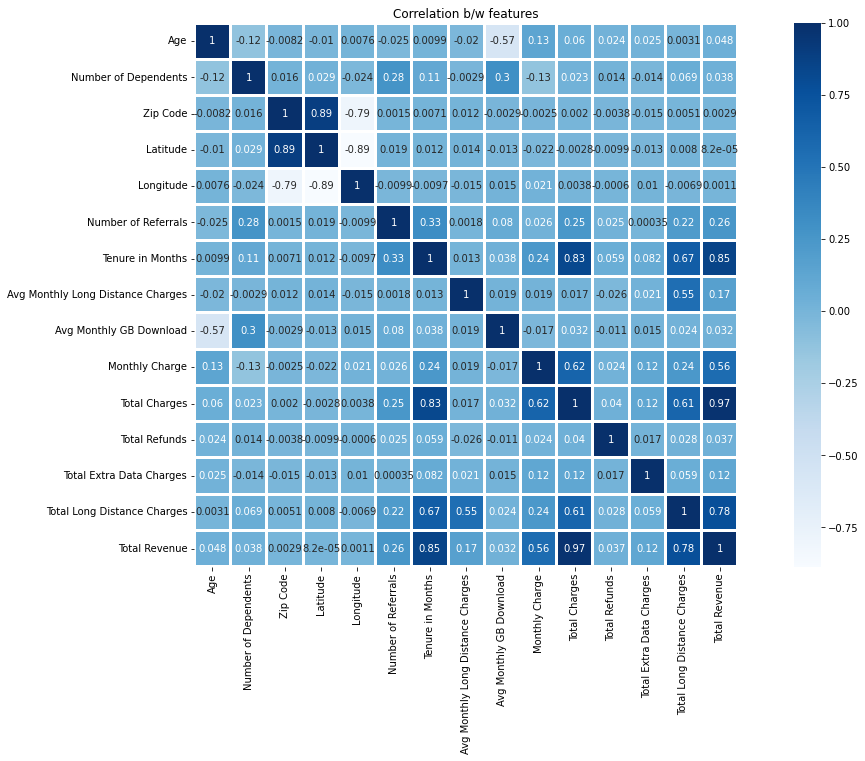

In [11]:
plt.figure(figsize=(20,10))
sns.heatmap(data.corr(),cbar=1,linewidths=2,annot=True,square=True,cmap="Blues")
plt.title("Correlation b/w features")
plt.show()

Dropping/Filling Columns

In [12]:
data_copy = data.copy()  # all changes in data_copy

In [13]:
data_copy.drop(columns= ['Customer ID'], axis=1, inplace=True)

In [14]:
data_copy.shape
data_copy.head()

,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason,Customer Status
0,Female,37,Yes,0,Frazier Park,93225,34.827662,-118.999073,2,9,...,Credit Card,65.6,593.30,0.00,0,381.51,974.81,NaN,NaN,Stayed
1,Male,46,No,0,Glendale,91206,34.162515,-118.203869,0,9,...,Credit Card,-4.0,542.40,38.33,10,96.21,610.28,NaN,NaN,Stayed
2,Male,50,No,0,Costa Mesa,92627,33.645672,-117.922613,0,4,...,Bank Withdrawal,73.9,280.85,0.00,0,134.60,415.45,Competitor,Competitor had better devices,Churned
3,Male,78,Yes,0,Martinez,94553,38.014457,-122.115432,1,13,...,Bank Withdrawal,98.0,1237.85,0.00,0,361.66,1599.51,Dissatisfaction,Product dissatisfaction,Churned
4,Female,75,Yes,0,Camarillo,93010,34.227846,-119.079903,3,3,...,Credit Card,83.9,267.40,0.00,0,22.14,289.54,Dissatisfaction,Network reliability,Churned


In [15]:
numeric_columns = []
for i in data.describe():
  numeric_columns.append(i)

print(numeric_columns)

# filling missing values in numerical data with mean : Simple Imputer
for cols in numeric_columns:
  data_copy[cols].fillna(data[cols].mean())

['Age', 'Number of Dependents', 'Zip Code', 'Latitude', 'Longitude', 'Number of Referrals', 'Tenure in Months', 'Avg Monthly Long Distance Charges', 'Avg Monthly GB Download', 'Monthly Charge', 'Total Charges', 'Total Refunds', 'Total Extra Data Charges', 'Total Long Distance Charges', 'Total Revenue']


In [16]:
def encode(df,column_name):# label encoding on given column and returns dictionary for later use (for all but churn ~)
  if(column_name in ['Churn Reason','Churn Category']):
    df.loc[df["Customer Status"] == "Stayed",column_name] = "Not Valid"
    df.loc[df["Customer Status"] == "Joined",column_name] = "Not Valid"

  unique_val = df[column_name].unique()
  for i in range(len(unique_val)):
    if(type(unique_val[i])!= str and math.isnan(unique_val[i])):
        unique_val = np.delete(unique_val, i)
        break

  
  label_value = {} 
  value_label = {}
  for i in range(0,len(unique_val)):
          label_value[unique_val[i]] = i
          value_label[i] = unique_val[i]

  df[column_name].replace(label_value,inplace=True)
  return value_label

def replace_labels(df,cname,label_mapping):
    df[cname].replace(label_mapping,inplace=True)

In [17]:
dc = data_copy.copy()
# print(encode(data_copy,'Churn Reason'))
data_copy.head()
data_copy['Churn Reason'].unique()
# print(data_copy['Churn Reason'].value_counts())


array([nan, 'Competitor had better devices', 'Product dissatisfaction',
       'Network reliability', 'Limited range of services',
       'Competitor made better offer', "Don't know",
       'Long distance charges', 'Attitude of service provider',
       'Attitude of support person',
       'Competitor offered higher download speeds',
       'Competitor offered more data',
       'Lack of affordable download/upload speed', 'Deceased', 'Moved',
       'Service dissatisfaction', 'Price too high',
       'Lack of self-service on Website',
       'Poor expertise of online support', 'Extra data charges',
       'Poor expertise of phone support'], dtype=object)

In [19]:
categorical_columns = [] 
for i in data_copy.columns:
  if(i not in numeric_columns):
    categorical_columns.append(i)
  

# print(categorical_columns)

label_mapping = []   # 
for i in categorical_columns:
  label_mapping.append(encode(data_copy,i))

data_copy.head()

,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason,Customer Status
0,0,37,0,0,0,93225,34.827662,-118.999073,2,9,...,0,65.6,593.30,0.00,0,381.51,974.81,0,0,0
1,1,46,1,0,1,91206,34.162515,-118.203869,0,9,...,0,-4.0,542.40,38.33,10,96.21,610.28,0,0,0
2,1,50,1,0,2,92627,33.645672,-117.922613,0,4,...,1,73.9,280.85,0.00,0,134.60,415.45,1,1,1
3,1,78,0,0,3,94553,38.014457,-122.115432,1,13,...,1,98.0,1237.85,0.00,0,361.66,1599.51,2,2,1
4,0,75,0,0,4,93010,34.227846,-119.079903,3,3,...,0,83.9,267.40,0.00,0,22.14,289.54,2,3,1


In [20]:
# filling missing categorical data
# 1)prevent imbalanced dataset within categories (occurs using most freq)
# 2) use classifier to predict missing values
# 3) Unsupervised ml

# Use:KNN Imputer
from sklearn.impute import KNNImputer

imputer = KNNImputer(n_neighbors=1)
imputed_array = imputer.fit_transform(data_copy)


df = pd.DataFrame(imputed_array,columns = data_copy.columns)   # use df for computations
final_df = df.copy()
print(len(df))
df.head()

7043


,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason,Customer Status
0,0.0,37.0,0.0,0.0,0.0,93225.0,34.827662,-118.999073,2.0,9.0,...,0.0,65.6,593.30,0.00,0.0,381.51,974.81,0.0,0.0,0.0
1,1.0,46.0,1.0,0.0,1.0,91206.0,34.162515,-118.203869,0.0,9.0,...,0.0,-4.0,542.40,38.33,10.0,96.21,610.28,0.0,0.0,0.0
2,1.0,50.0,1.0,0.0,2.0,92627.0,33.645672,-117.922613,0.0,4.0,...,1.0,73.9,280.85,0.00,0.0,134.60,415.45,1.0,1.0,1.0
3,1.0,78.0,0.0,0.0,3.0,94553.0,38.014457,-122.115432,1.0,13.0,...,1.0,98.0,1237.85,0.00,0.0,361.66,1599.51,2.0,2.0,1.0
4,0.0,75.0,0.0,0.0,4.0,93010.0,34.227846,-119.079903,3.0,3.0,...,0.0,83.9,267.40,0.00,0.0,22.14,289.54,2.0,3.0,1.0


In [21]:
final_df['Customer Status'].value_counts()

0.0    4720
1.0    1869
2.0     454
Name: Customer Status, dtype: int64

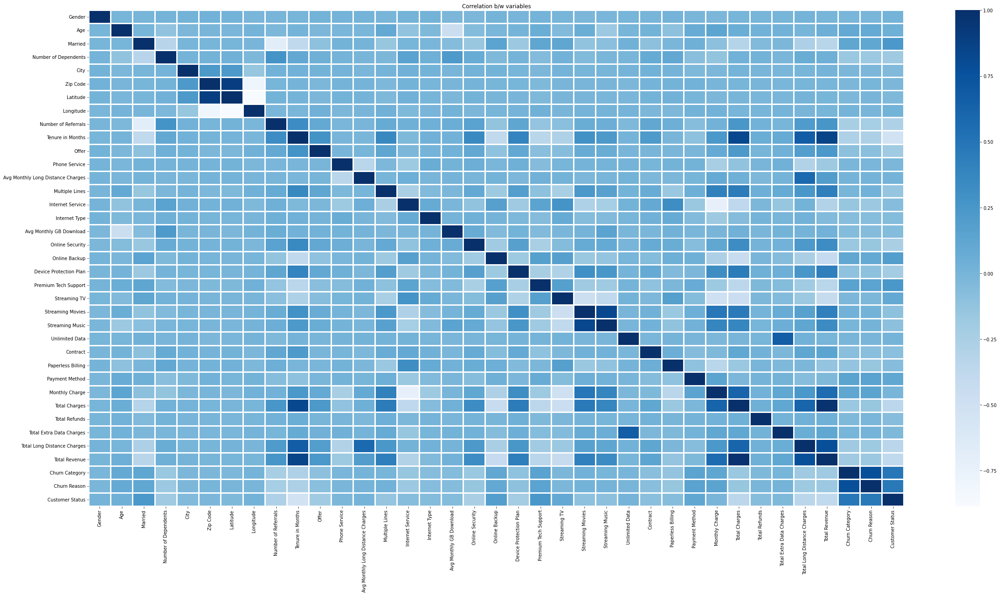

In [22]:
plt.figure(figsize=(40,20))
sns.heatmap(df.corr(),cbar=1,linewidths=2,annot=False,cmap="Blues")
plt.title("Correlation b/w variables")
plt.show()

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
        34, 35, 36]), <a list of 37 Text major ticklabel objects>)

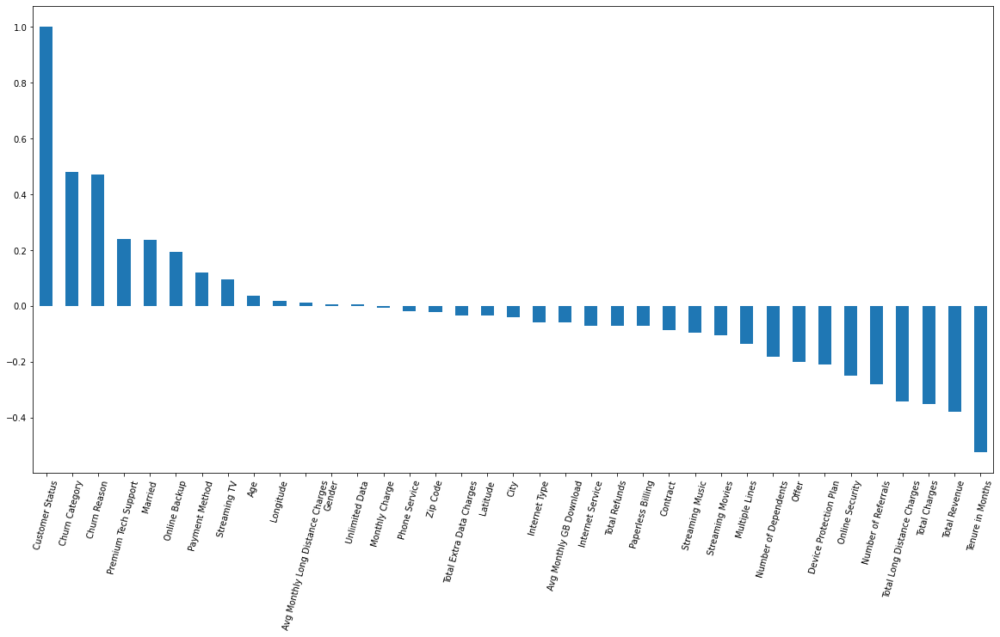

In [23]:
plt.figure(figsize=(20,10))

df.corr()['Customer Status'].sort_values(ascending = False).plot(kind='bar')
plt.xticks(rotation=75)

In [24]:
idx = 0
for i in categorical_columns:
  replace_labels(df,i,label_mapping[idx])
  idx+=1
df.head()

,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,...,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason,Customer Status
0,Female,37.0,Yes,0.0,Frazier Park,93225.0,34.827662,-118.999073,2.0,9.0,...,Credit Card,65.6,593.30,0.00,0.0,381.51,974.81,Not Valid,Not Valid,Stayed
1,Male,46.0,No,0.0,Glendale,91206.0,34.162515,-118.203869,0.0,9.0,...,Credit Card,-4.0,542.40,38.33,10.0,96.21,610.28,Not Valid,Not Valid,Stayed
2,Male,50.0,No,0.0,Costa Mesa,92627.0,33.645672,-117.922613,0.0,4.0,...,Bank Withdrawal,73.9,280.85,0.00,0.0,134.60,415.45,Competitor,Competitor had better devices,Churned
3,Male,78.0,Yes,0.0,Martinez,94553.0,38.014457,-122.115432,1.0,13.0,...,Bank Withdrawal,98.0,1237.85,0.00,0.0,361.66,1599.51,Dissatisfaction,Product dissatisfaction,Churned
4,Female,75.0,Yes,0.0,Camarillo,93010.0,34.227846,-119.079903,3.0,3.0,...,Credit Card,83.9,267.40,0.00,0.0,22.14,289.54,Dissatisfaction,Network reliability,Churned


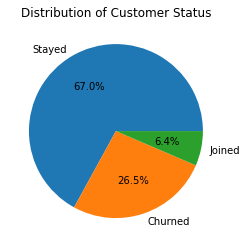

In [25]:


count = []
mylabels = []
for i in df['Customer Status'].unique():
  count.append(df['Customer Status'].value_counts()[i])
  mylabels.append(i)

plt.pie(count, labels = mylabels,autopct='%1.1f%%')
plt.title("Distribution of Customer Status")
# plt.legend()
plt.show()


Analysis for Numerical Variables

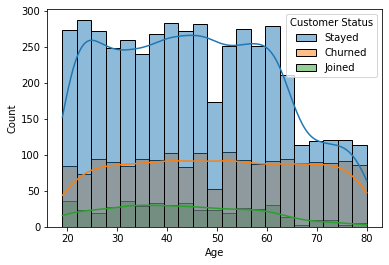

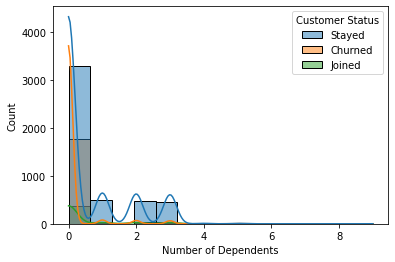

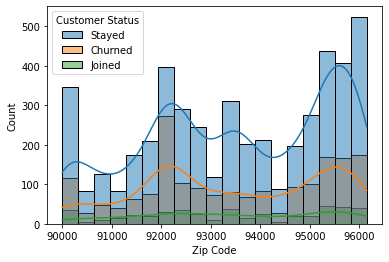

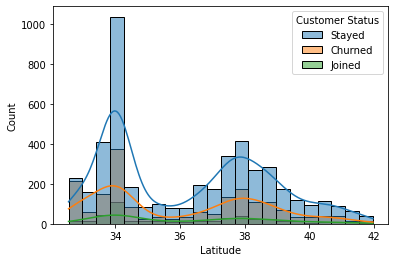

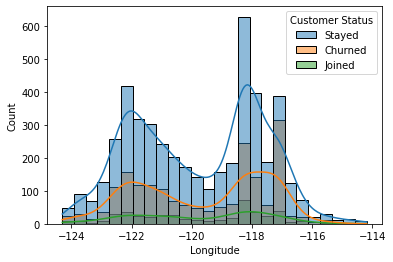

...

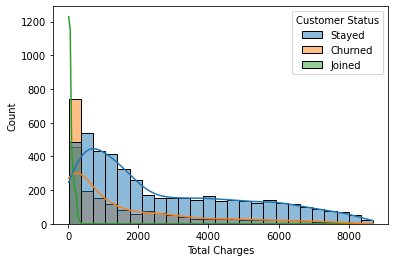

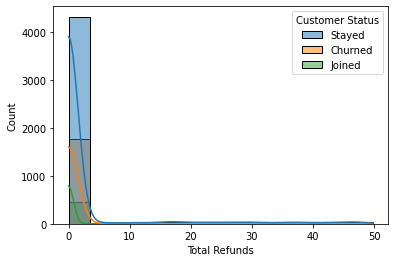

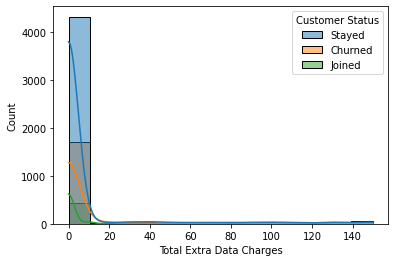

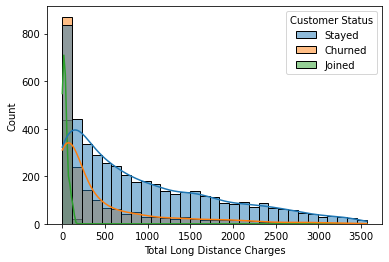

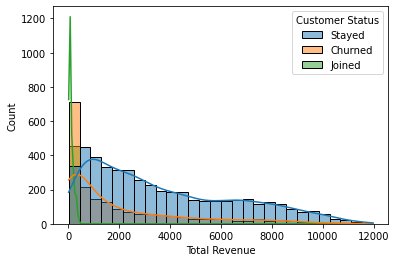

In [26]:
for col in numeric_columns:
  plt.figure()
  sns.histplot(data = df,x = col,kde = True,hue = 'Customer Status')

Analysis for Categorical Variables


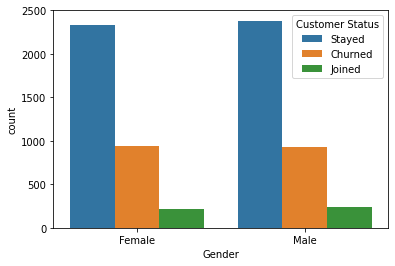

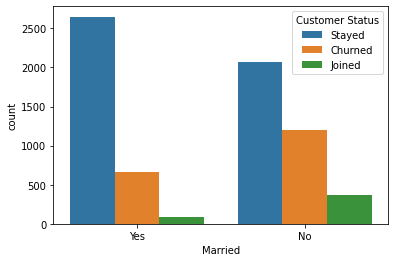

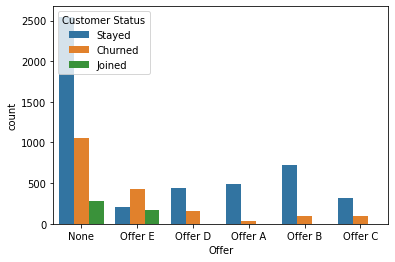

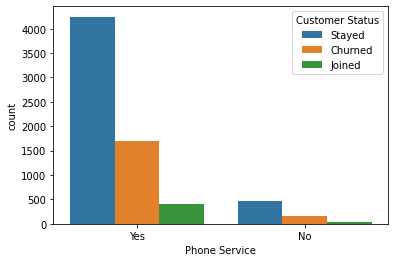

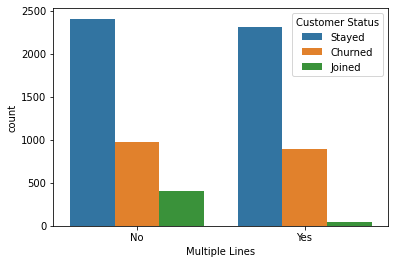

...

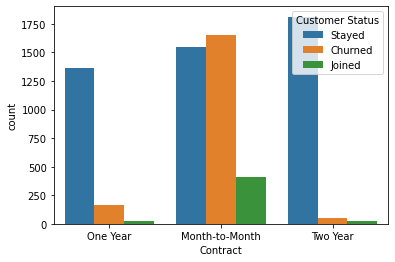

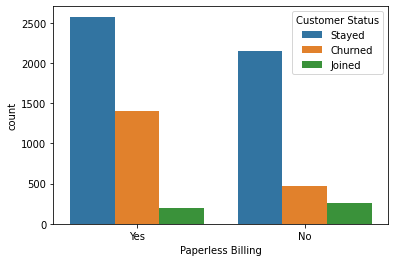

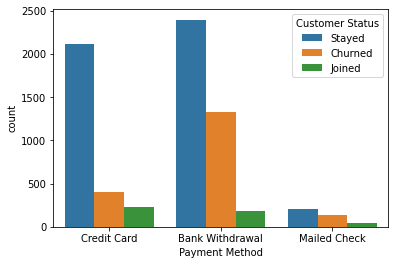

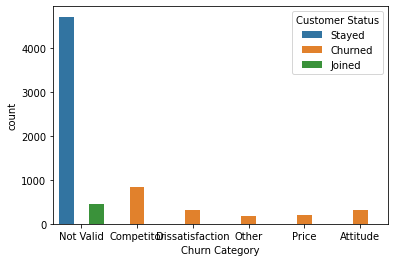

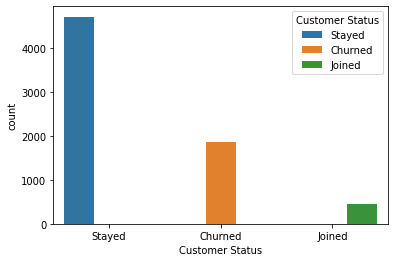

In [27]:
df1 = df.drop(columns = numeric_columns+['City','Churn Reason'],inplace = False)  

for col in df1.columns:
      plt.figure()
      sns.countplot(data = df1, x = col ,hue = 'Customer Status')

Text(0.5, 1.0, 'Churned Customer subscribed to Internet service')

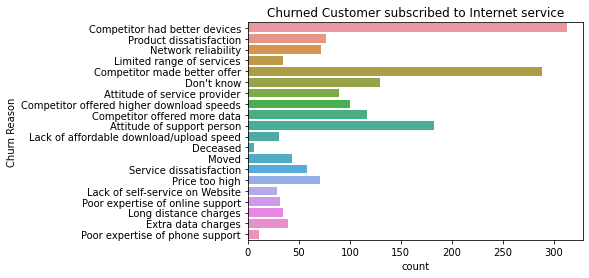

In [28]:
sns.countplot(data = df.loc[(df['Internet Service'] == 'Yes') & (df['Customer Status'] == 'Churned')] , y = 'Churn Reason' )
plt.title('Churned Customer subscribed to Internet service')
# df.loc[(df['Internet Service'] == 'Yes') & (df['Customer Status'] == 'Churned')]

In [ ]:
len(data.loc[(data['Married'] == 'No') & (data['Customer Status'] == 'Stayed')])/len(data.loc[(data['Married'] == 'No')])

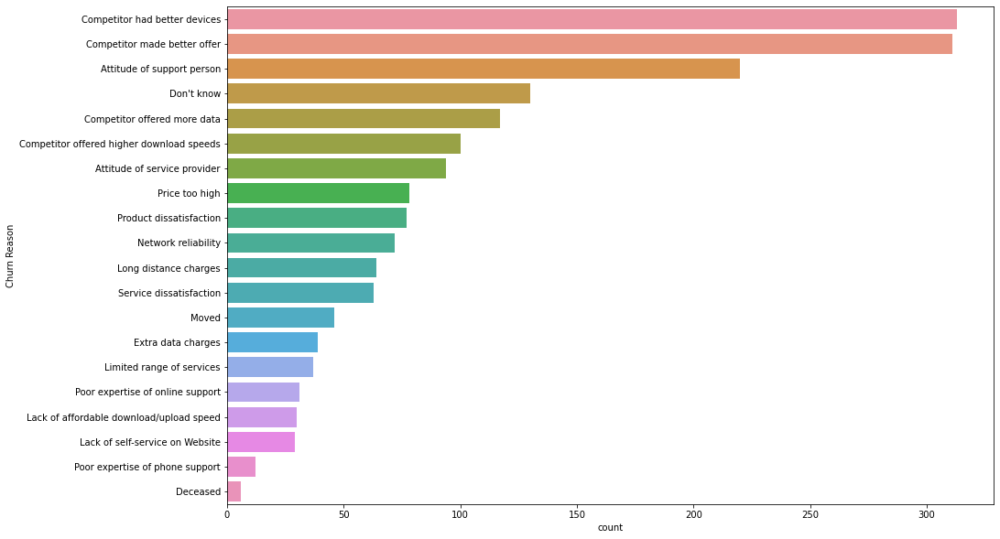

In [29]:
fig = plt.figure(figsize = (15, 10))
sns.countplot(data = data, y = data['Churn Reason'], order = data['Churn Reason'].value_counts().index)



In [30]:
# Small yet important piece of code
print(categorical_columns)
print(len(categorical_columns))
print(len(numeric_columns))

['Gender', 'Married', 'City', 'Offer', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Internet Type', 'Online Security', 'Online Backup', 'Device Protection Plan', 'Premium Tech Support', 'Streaming TV', 'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing', 'Payment Method', 'Churn Category', 'Churn Reason', 'Customer Status']
22
15


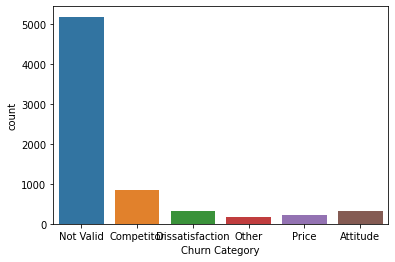

In [31]:
sns.countplot(data = df,x = 'Churn Category')

In [33]:
# # # Age-Gender most of the customers who churned are >60 yrs old for both male and females
import plotly.express as px
fig=px.scatter(df,  x="Gender", y= "Age", title="Gender vs Age",  color='Customer Status')
fig.show()

In [34]:
# # 
fig=px.scatter(df,  x="Avg Monthly Long Distance Charges", y= "Monthly Charge", title="Avg Monthly Long Distance Charges vs Monthly charge",  color='Customer Status')
fig.show()

# # Joined : MC low & Long dist charge 
# # Stayed distributed all over the graph
# # 

In [35]:
# # With the increase in the number of referrals person who stayed increased
fig=px.scatter(df,  x="Number of Referrals", y= "Tenure in Months", title="Number of Referrals vs Tenure in Months",  color='Customer Status')
fig.show()

In [36]:
# # Almost all the people joined when revenue and long distance charges are very less
fig=px.scatter(df,  x="Total Revenue", y= "Total Long Distance Charges", title="Total Revenue vs Total Long Distance Charges",  color='Customer Status')
fig.show()

In [37]:
fig=px.scatter(df,  x="Total Charges", y= "Total Refunds", title="Total Charges vs Total Refunds",  color='Customer Status')
fig.show()

In [38]:
# # highly correlated
fig=px.scatter(df,  x="Total Charges", y= "Total Revenue", title="Total Charges vs Total Revenue",  color='Customer Status')
fig.show()

In [39]:
# # not at all correlated
fig=px.scatter(df,  x="Avg Monthly Long Distance Charges", y= "Avg Monthly GB Download", title="Avg Monthly Long Distance Charges vs Avg Monthly GB Download",  color='Customer Status')
fig.show()

In [ ]:
# fig=px.scatter(df,  x="Monthly Charge", y= "Total Refunds", title="Total Charges vs Total Revenue",  color='Customer Status')
# fig.show()

In [ ]:
# fig=px.scatter(df,  x="Latitude", y= "Longitude", title="Latitude vs Longitude",  color='Customer Status')
# fig.show()

In [ ]:
# px.histogram(df, x='Monthly Charge', y= 'Total Refunds',title='Monthly Charge vs Total Refunds', color='Customer Status')

In [ ]:
# from plotnine import ggplot, aes, geom_line
# ggplot(data =df) + geom_line(aes(x="Total Revenue", y= "Total Refunds", color="Customer Status"))
# # ggplot(data,aes(x = tenure, color=Churn)) + geom_freqpoly(size=2)

In [ ]:
# ggplot(data =df) + geom_line(aes(x="Latitude", y= "Longitude", color="Customer Status"))

Joint-Plots

<Figure size 1080x504 with 0 Axes>

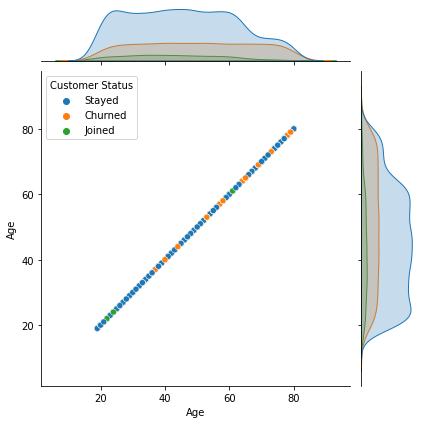

<Figure size 1080x504 with 0 Axes>

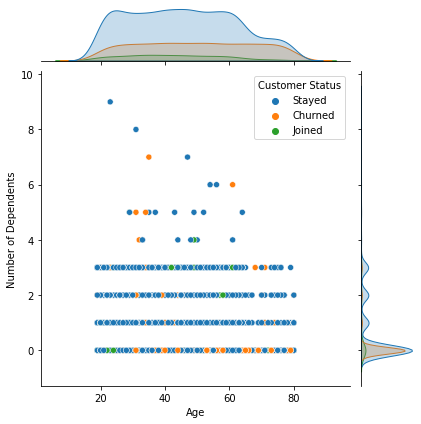

<Figure size 1080x504 with 0 Axes>

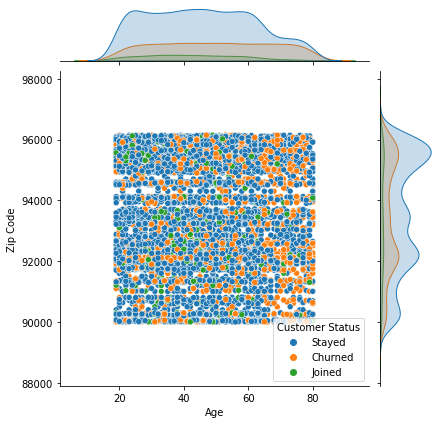

<Figure size 1080x504 with 0 Axes>

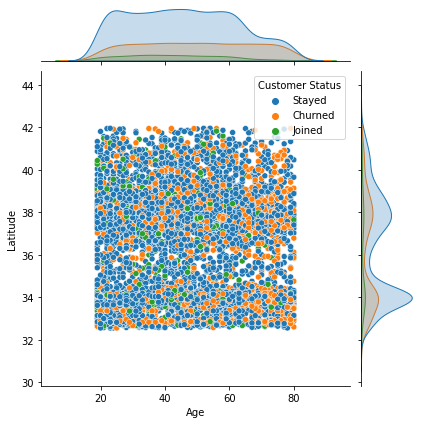

<Figure size 1080x504 with 0 Axes>

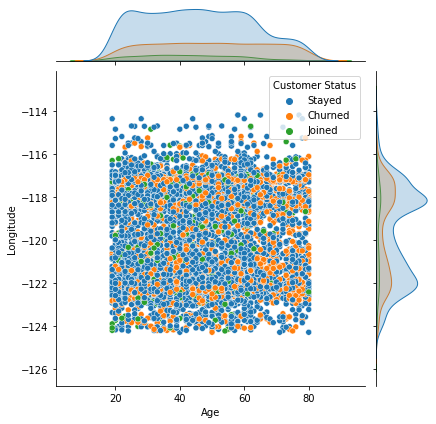

<Figure size 1080x504 with 0 Axes>

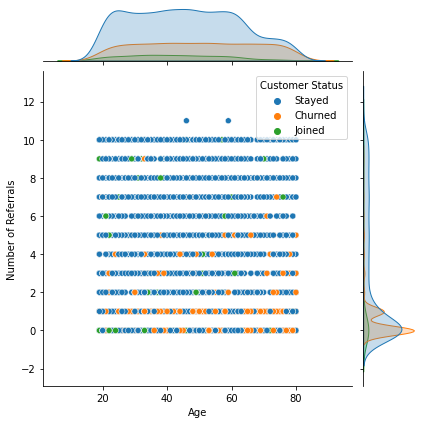

<Figure size 1080x504 with 0 Axes>

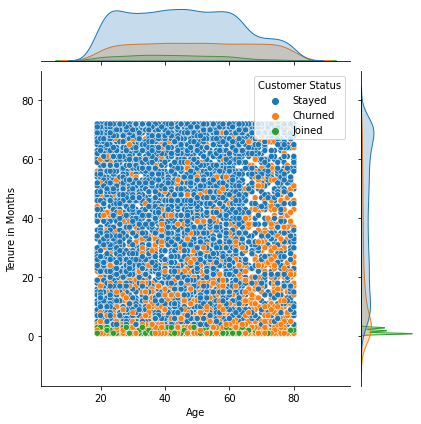

<Figure size 1080x504 with 0 Axes>

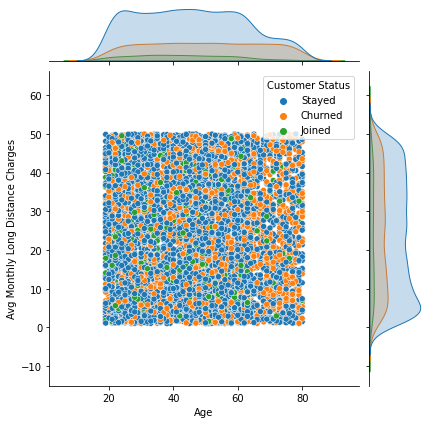

<Figure size 1080x504 with 0 Axes>

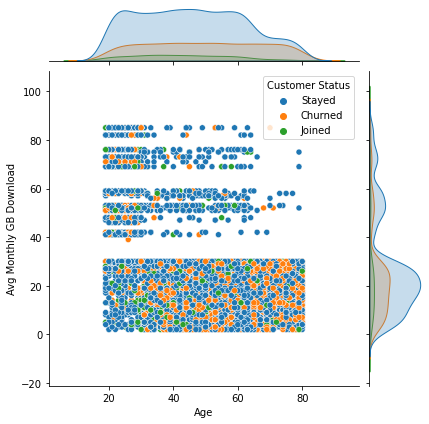

<Figure size 1080x504 with 0 Axes>

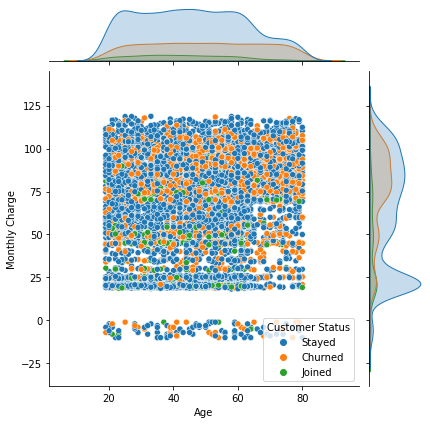

<Figure size 1080x504 with 0 Axes>

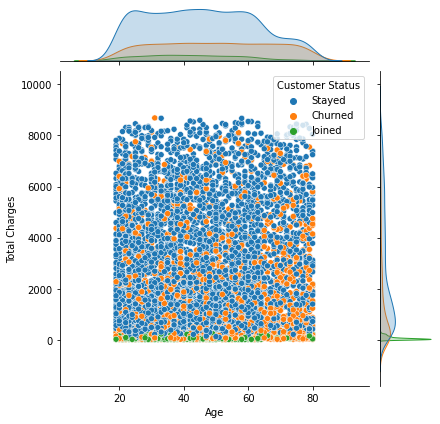

<Figure size 1080x504 with 0 Axes>

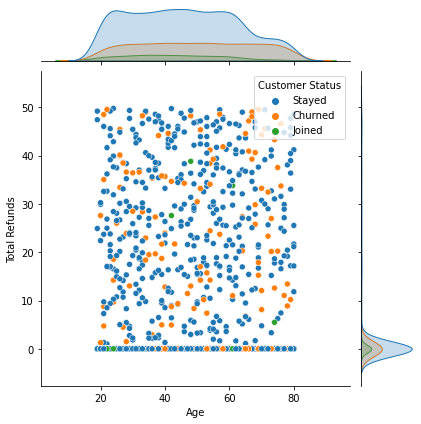

<Figure size 1080x504 with 0 Axes>

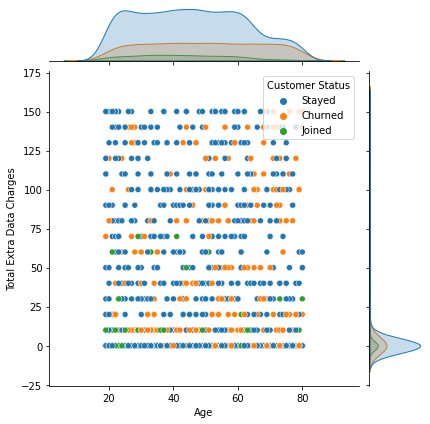

<Figure size 1080x504 with 0 Axes>

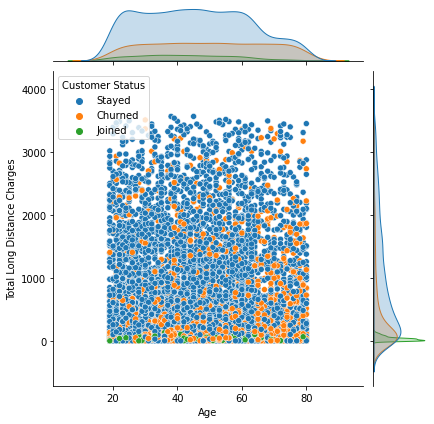

<Figure size 1080x504 with 0 Axes>

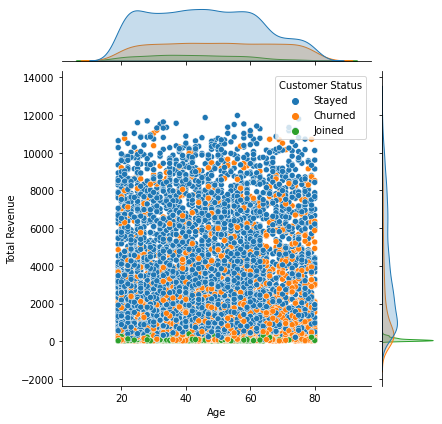

<Figure size 1080x504 with 0 Axes>

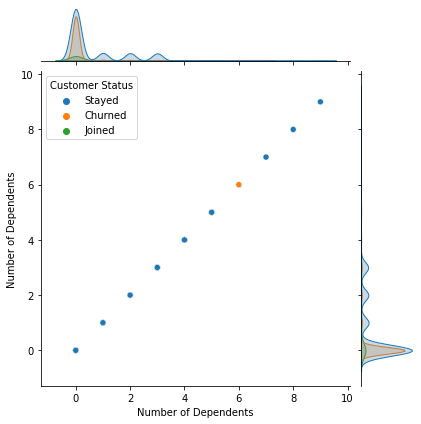

<Figure size 1080x504 with 0 Axes>

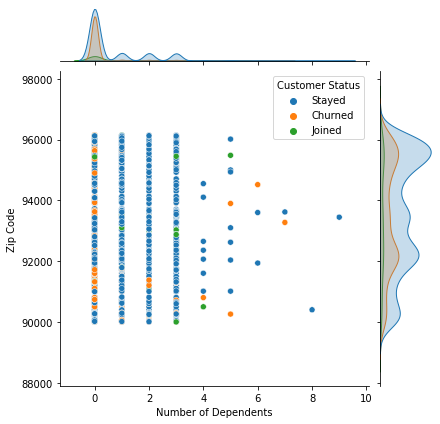

<Figure size 1080x504 with 0 Axes>

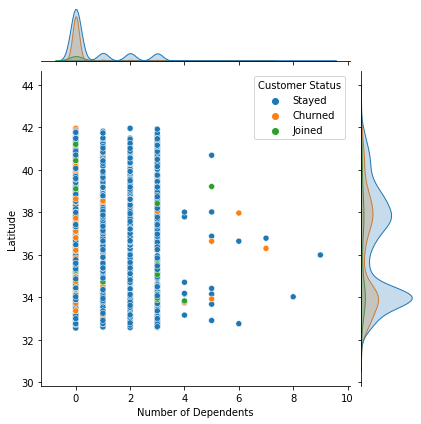

<Figure size 1080x504 with 0 Axes>

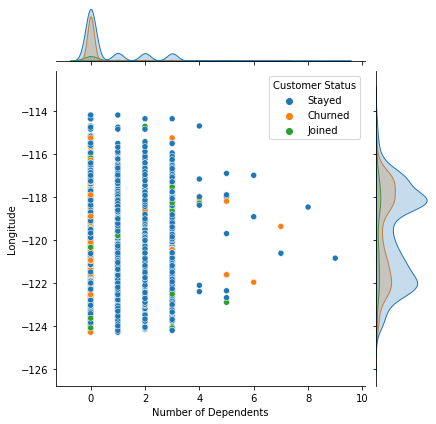

<Figure size 1080x504 with 0 Axes>

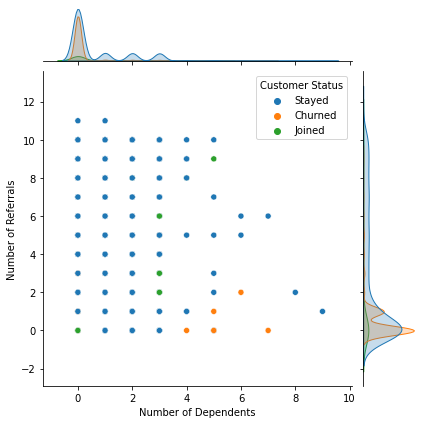

<Figure size 1080x504 with 0 Axes>

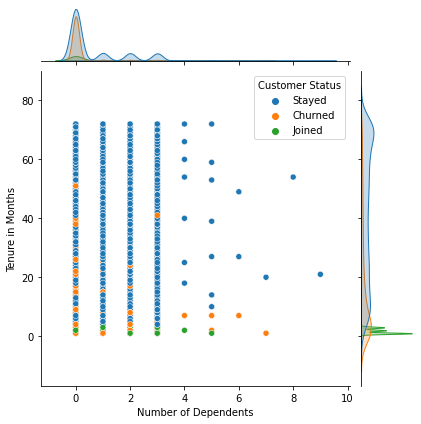

<Figure size 1080x504 with 0 Axes>

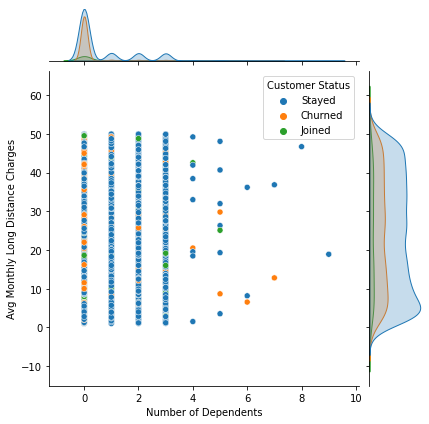

<Figure size 1080x504 with 0 Axes>

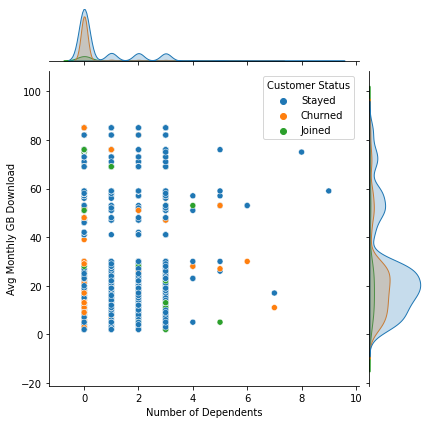

<Figure size 1080x504 with 0 Axes>

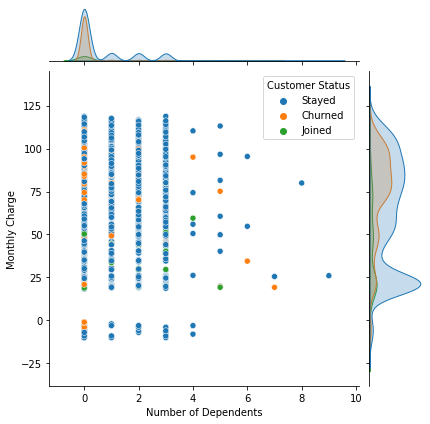

<Figure size 1080x504 with 0 Axes>

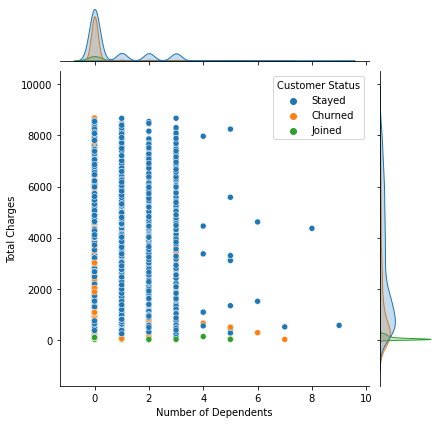

<Figure size 1080x504 with 0 Axes>

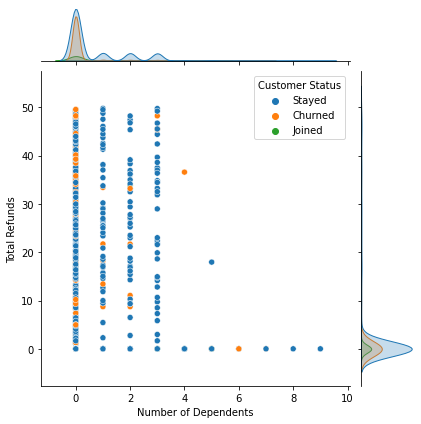

<Figure size 1080x504 with 0 Axes>

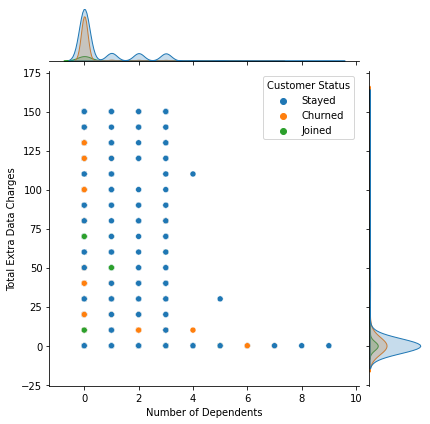

<Figure size 1080x504 with 0 Axes>

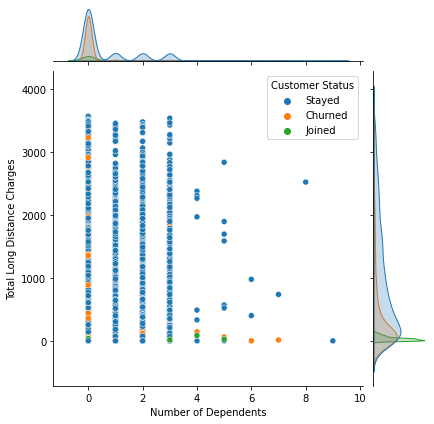

<Figure size 1080x504 with 0 Axes>

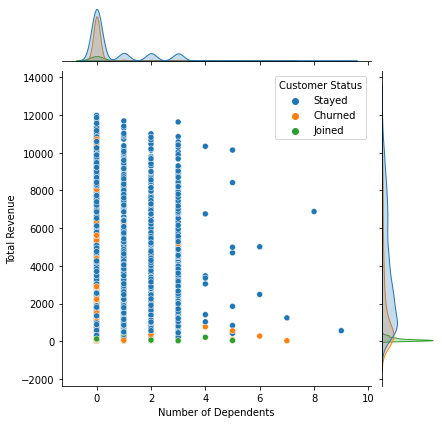

<Figure size 1080x504 with 0 Axes>

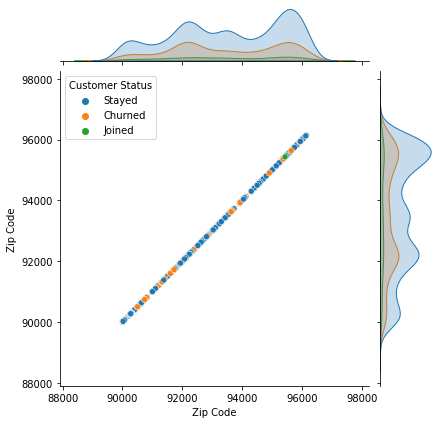

<Figure size 1080x504 with 0 Axes>

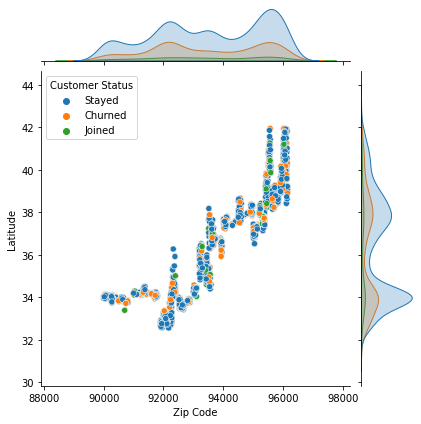

<Figure size 1080x504 with 0 Axes>

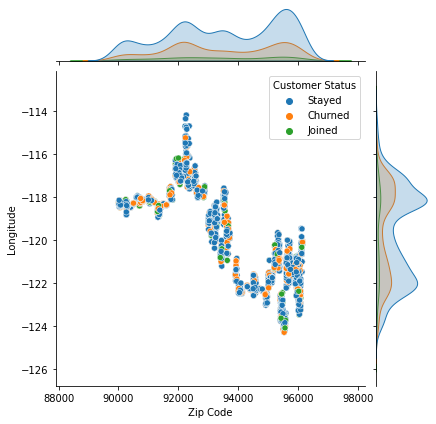

<Figure size 1080x504 with 0 Axes>

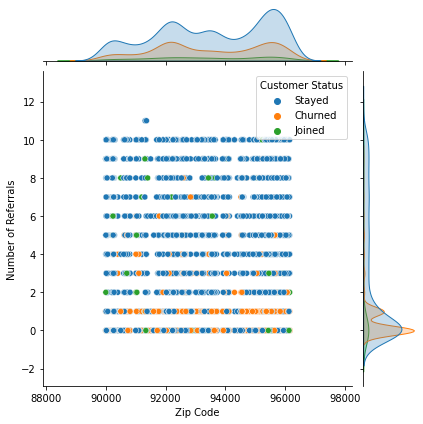

<Figure size 1080x504 with 0 Axes>

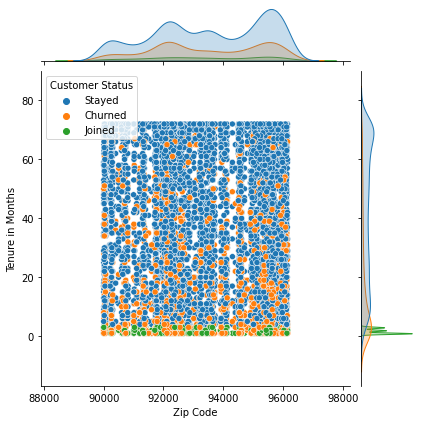

<Figure size 1080x504 with 0 Axes>

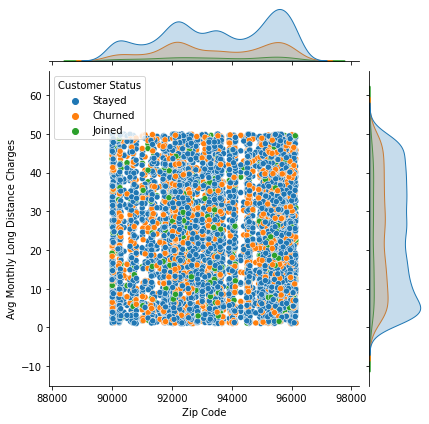

<Figure size 1080x504 with 0 Axes>

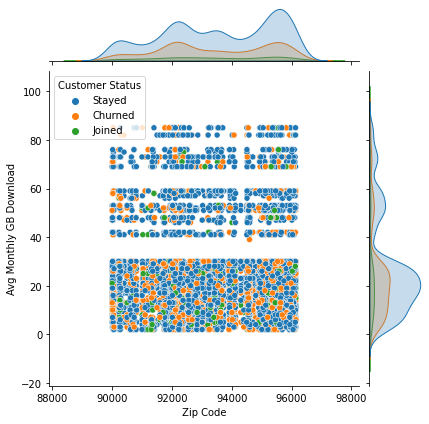

<Figure size 1080x504 with 0 Axes>

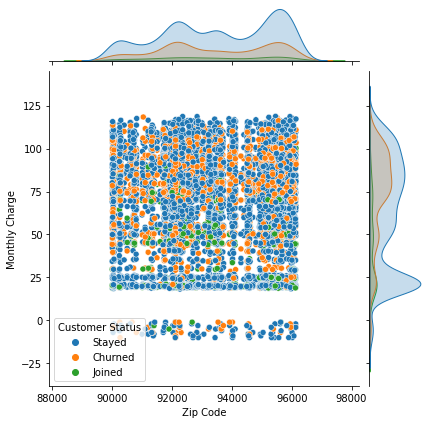

<Figure size 1080x504 with 0 Axes>

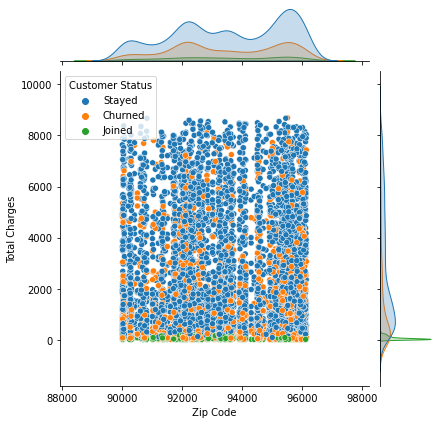

<Figure size 1080x504 with 0 Axes>

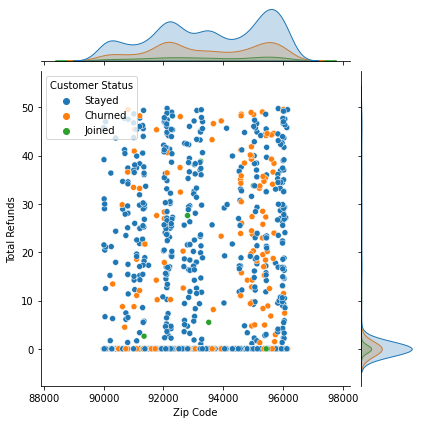

<Figure size 1080x504 with 0 Axes>

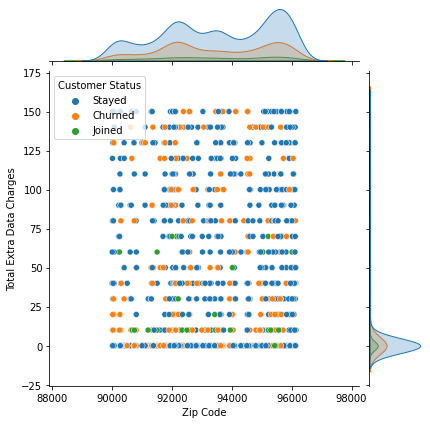

<Figure size 1080x504 with 0 Axes>

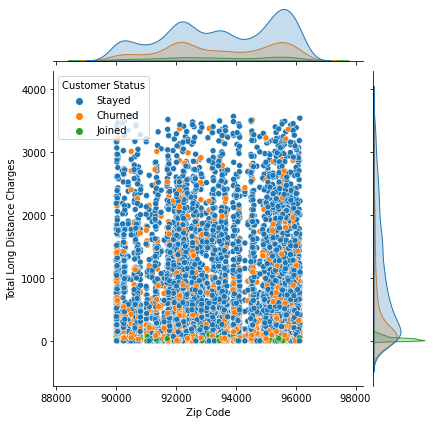

<Figure size 1080x504 with 0 Axes>

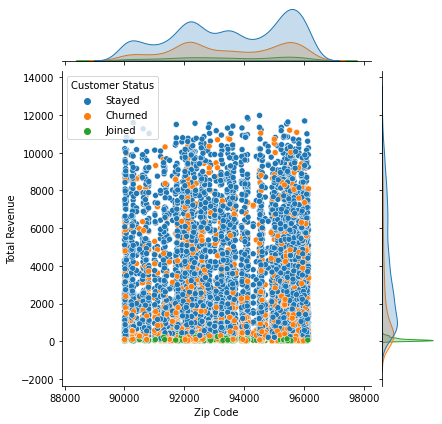

<Figure size 1080x504 with 0 Axes>

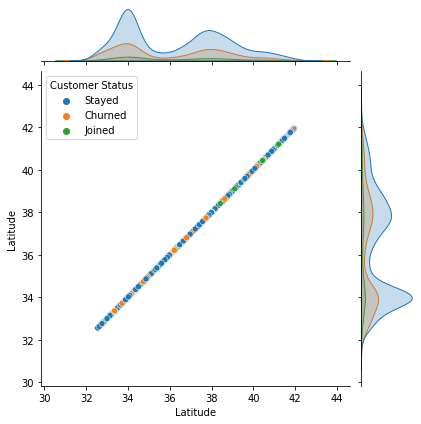

<Figure size 1080x504 with 0 Axes>

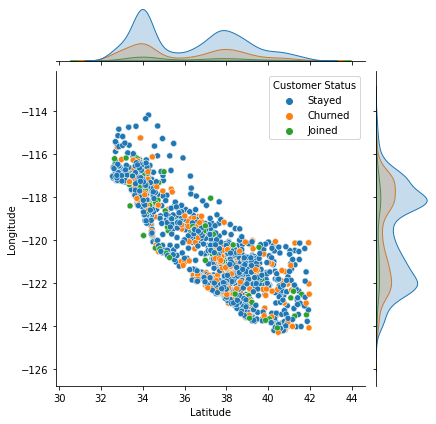

<Figure size 1080x504 with 0 Axes>

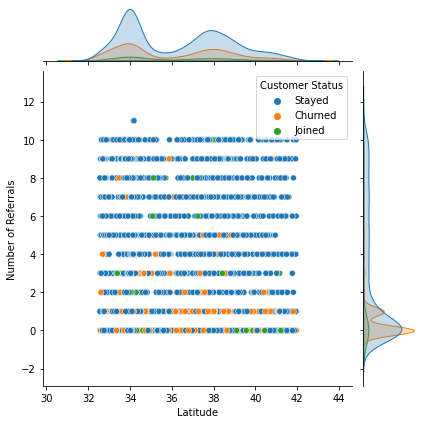

<Figure size 1080x504 with 0 Axes>

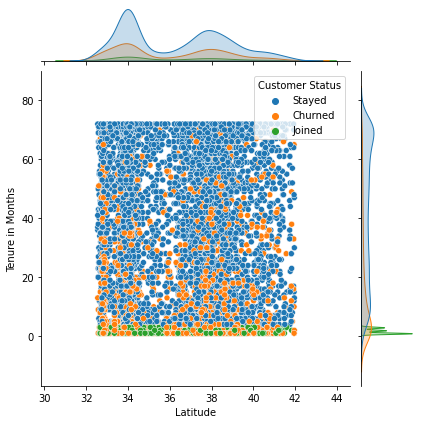

<Figure size 1080x504 with 0 Axes>

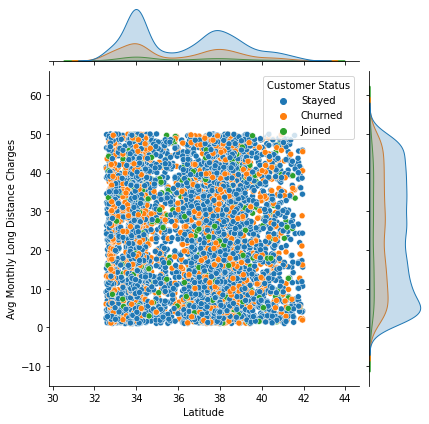

<Figure size 1080x504 with 0 Axes>

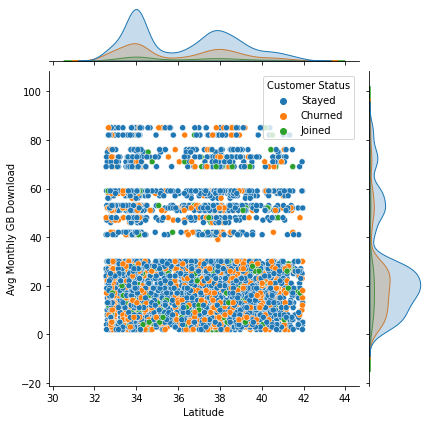

<Figure size 1080x504 with 0 Axes>

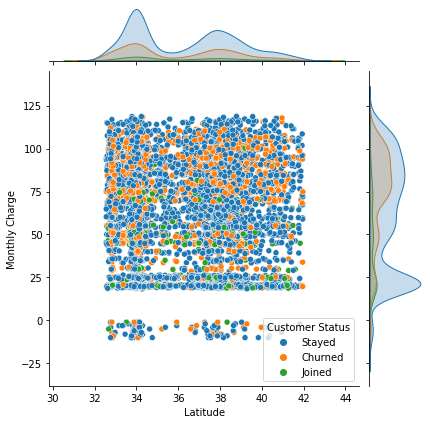

<Figure size 1080x504 with 0 Axes>

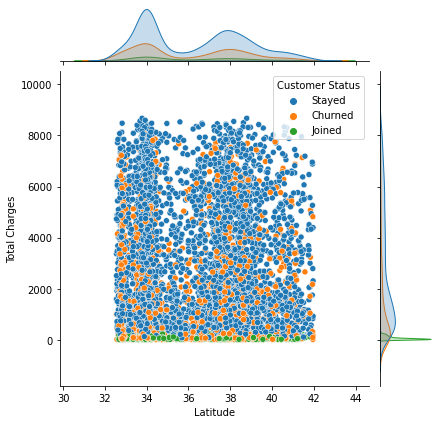

<Figure size 1080x504 with 0 Axes>

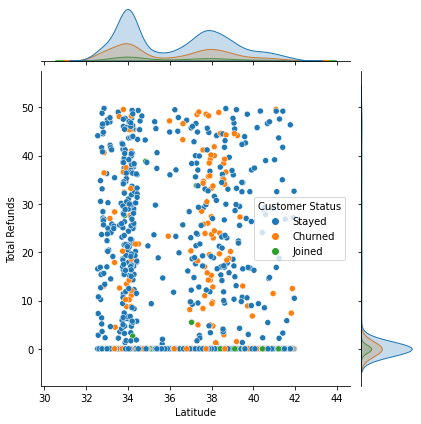

<Figure size 1080x504 with 0 Axes>

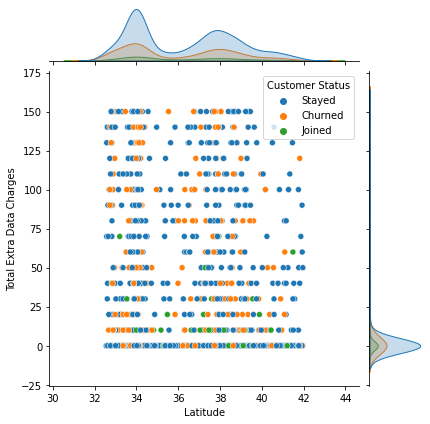

<Figure size 1080x504 with 0 Axes>

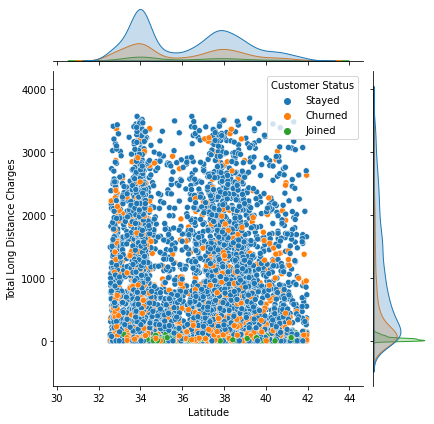

<Figure size 1080x504 with 0 Axes>

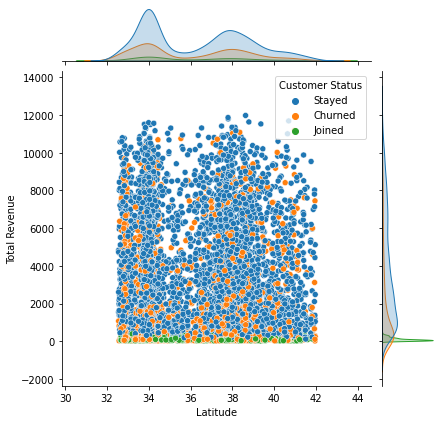

<Figure size 1080x504 with 0 Axes>

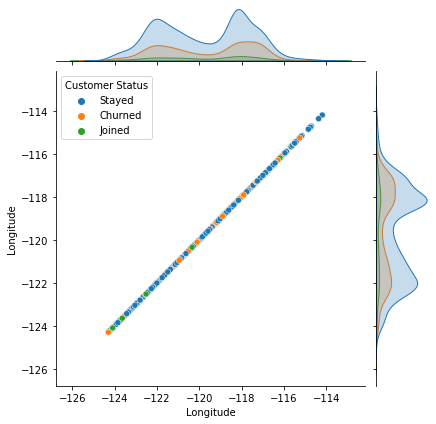

<Figure size 1080x504 with 0 Axes>

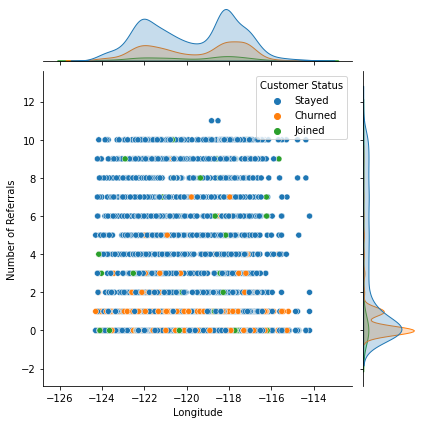

<Figure size 1080x504 with 0 Axes>

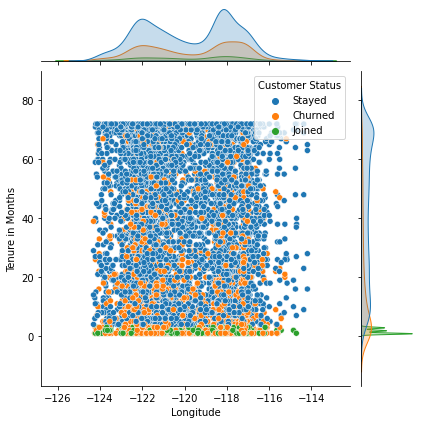

<Figure size 1080x504 with 0 Axes>

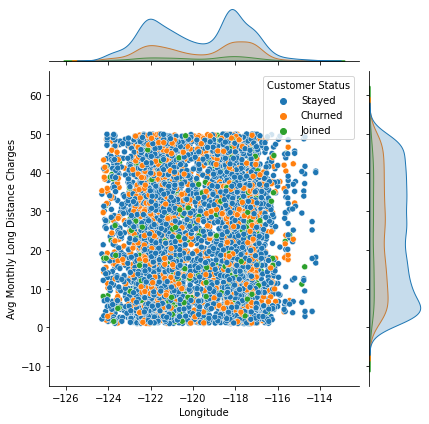

<Figure size 1080x504 with 0 Axes>

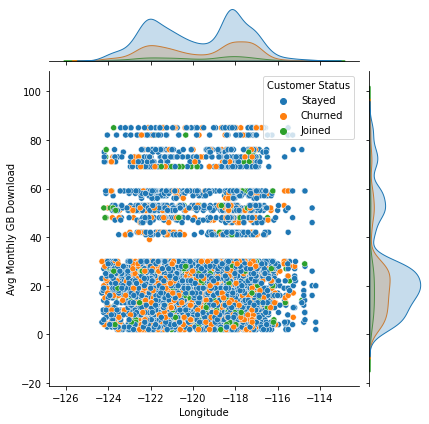

<Figure size 1080x504 with 0 Axes>

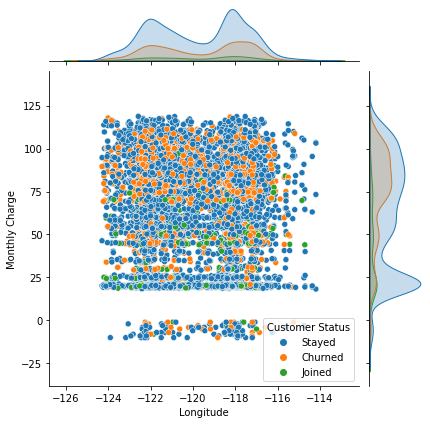

<Figure size 1080x504 with 0 Axes>

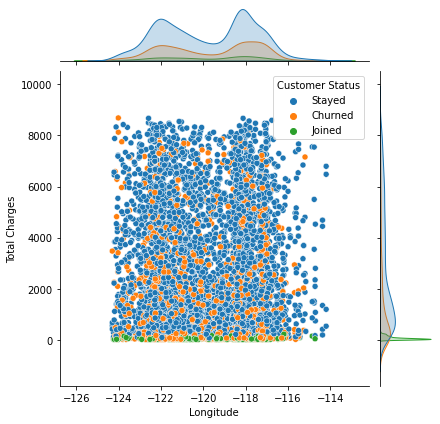

<Figure size 1080x504 with 0 Axes>

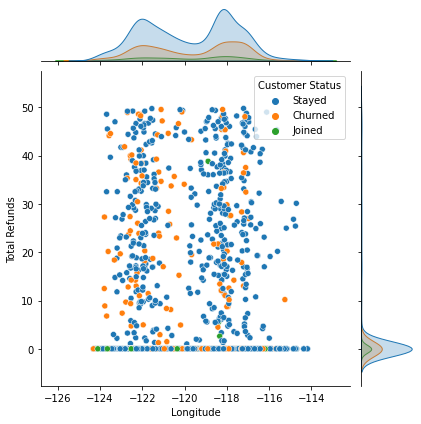

<Figure size 1080x504 with 0 Axes>

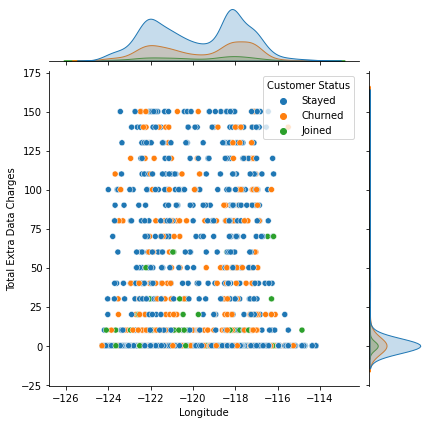

<Figure size 1080x504 with 0 Axes>

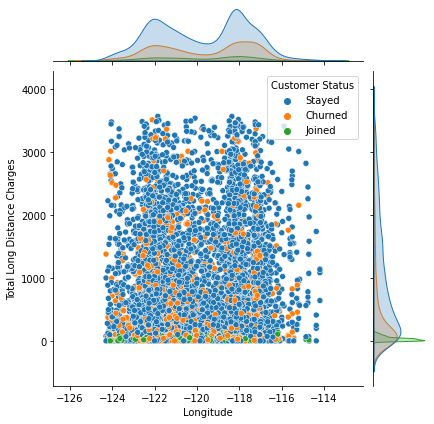

<Figure size 1080x504 with 0 Axes>

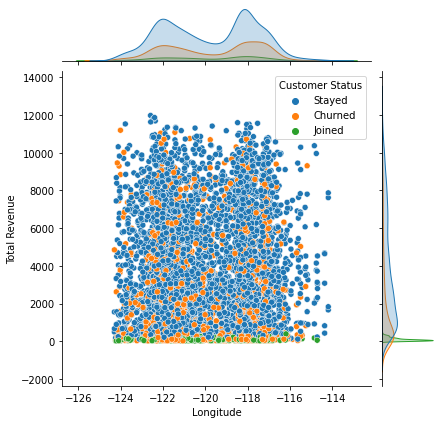

<Figure size 1080x504 with 0 Axes>

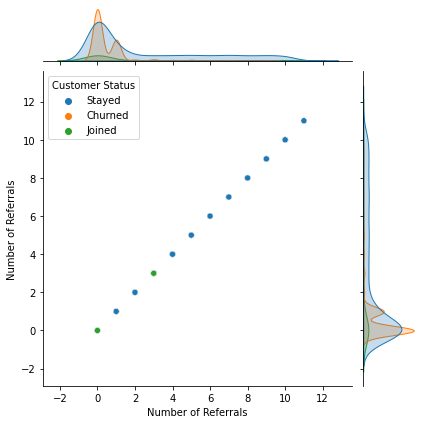

<Figure size 1080x504 with 0 Axes>

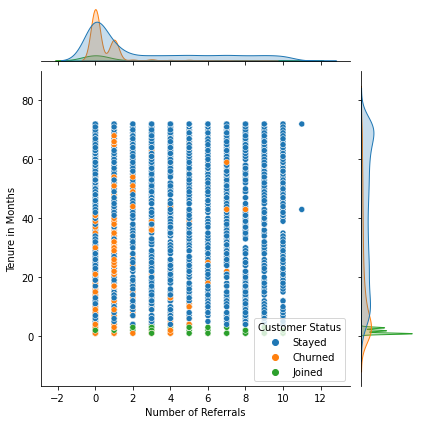

<Figure size 1080x504 with 0 Axes>

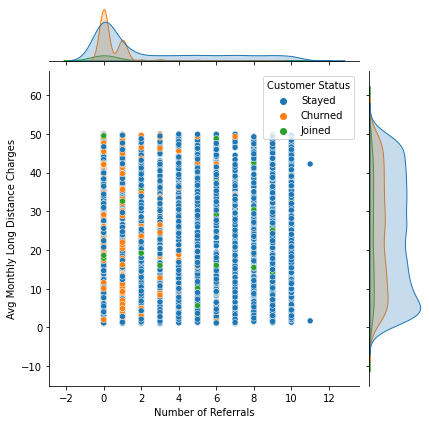

<Figure size 1080x504 with 0 Axes>

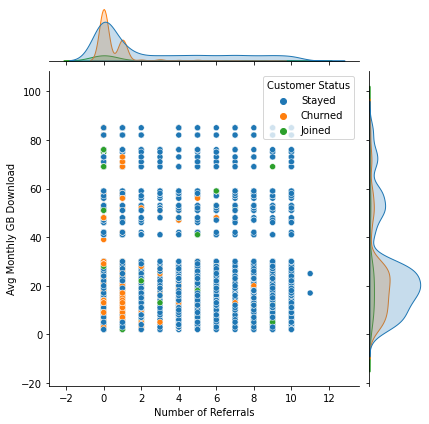

<Figure size 1080x504 with 0 Axes>

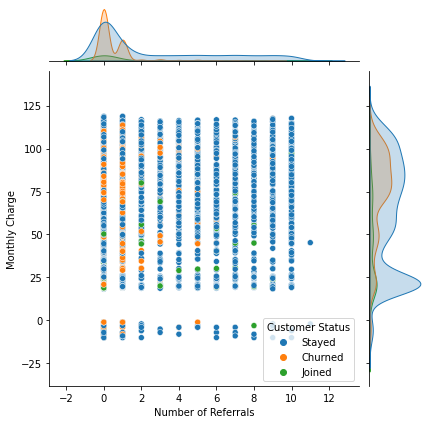

<Figure size 1080x504 with 0 Axes>

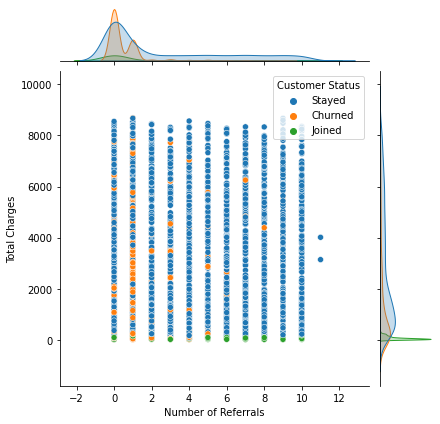

<Figure size 1080x504 with 0 Axes>

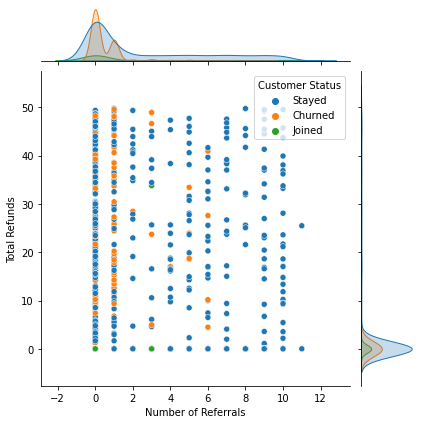

<Figure size 1080x504 with 0 Axes>

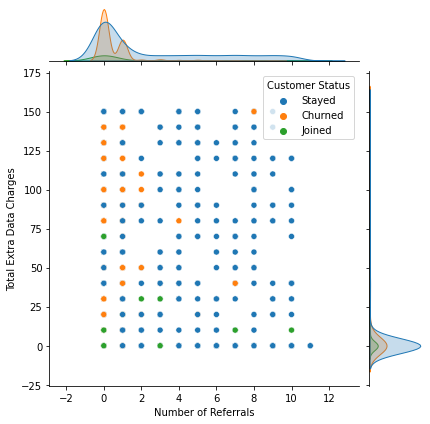

<Figure size 1080x504 with 0 Axes>

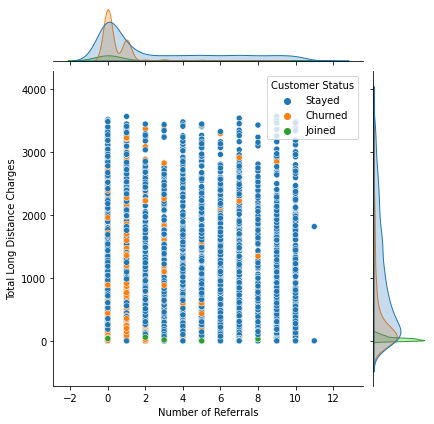

<Figure size 1080x504 with 0 Axes>

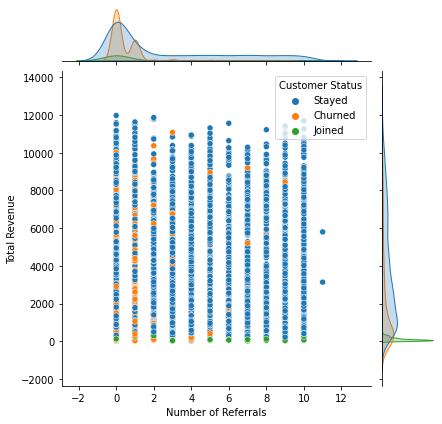

<Figure size 1080x504 with 0 Axes>

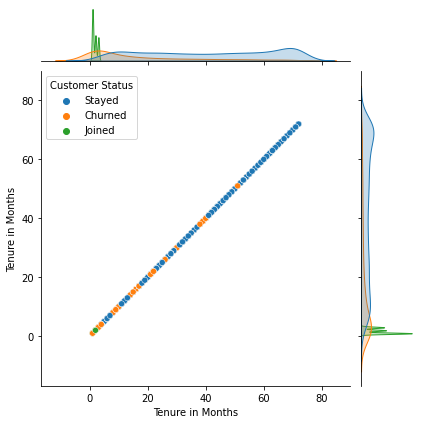

<Figure size 1080x504 with 0 Axes>

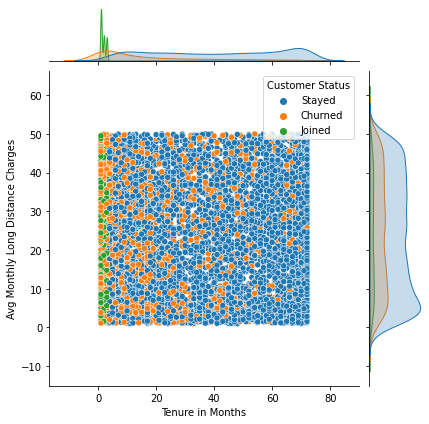

<Figure size 1080x504 with 0 Axes>

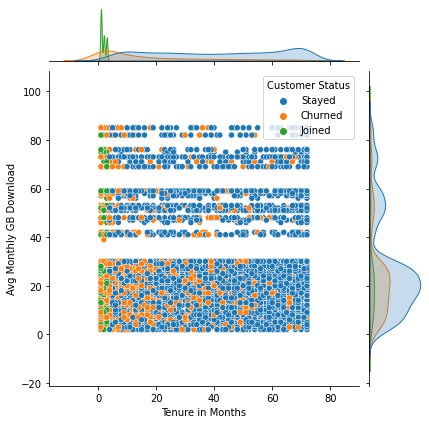

<Figure size 1080x504 with 0 Axes>

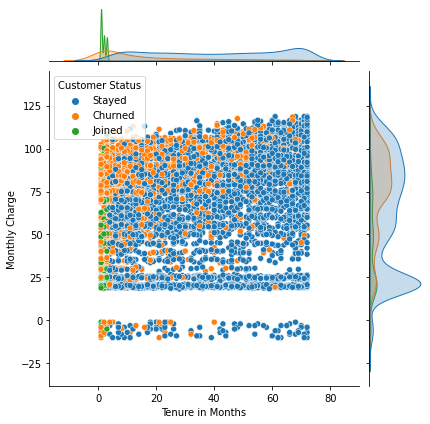

<Figure size 1080x504 with 0 Axes>

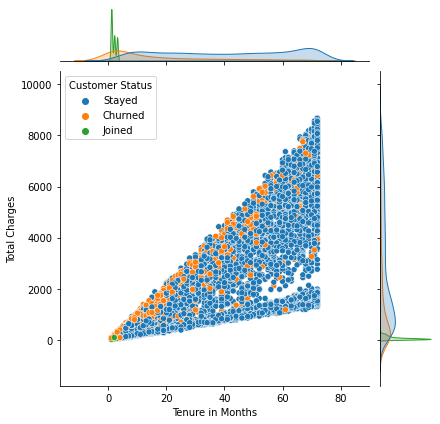

<Figure size 1080x504 with 0 Axes>

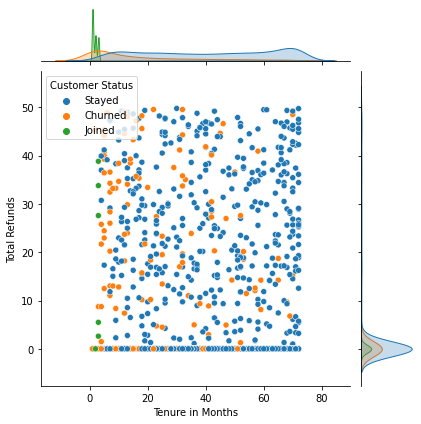

<Figure size 1080x504 with 0 Axes>

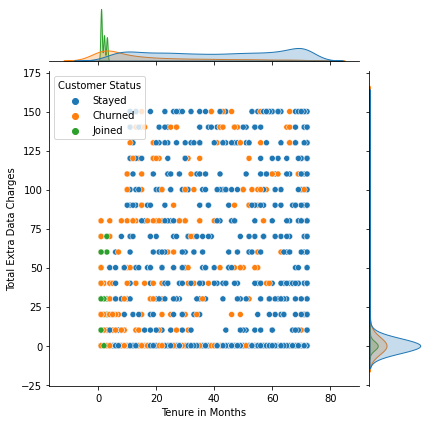

<Figure size 1080x504 with 0 Axes>

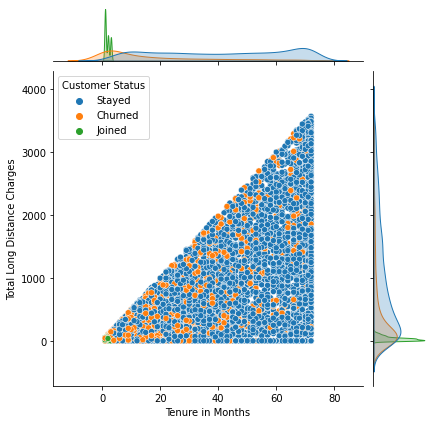

<Figure size 1080x504 with 0 Axes>

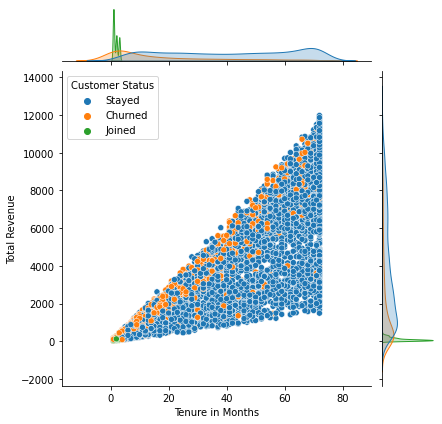

<Figure size 1080x504 with 0 Axes>

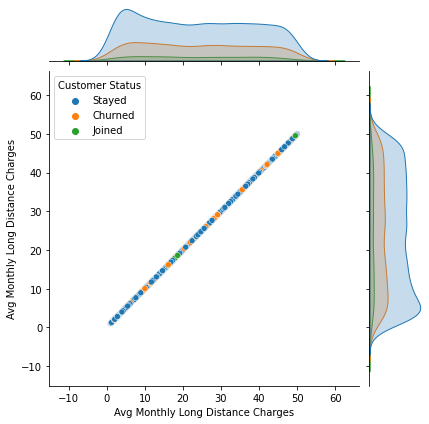

<Figure size 1080x504 with 0 Axes>

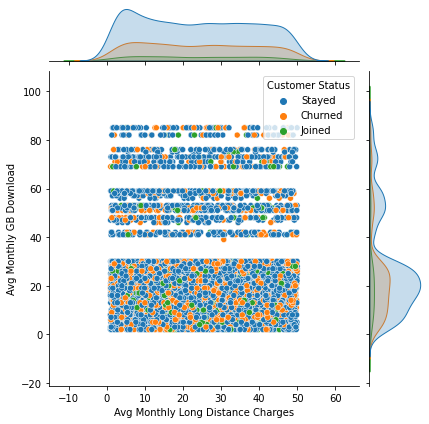

<Figure size 1080x504 with 0 Axes>

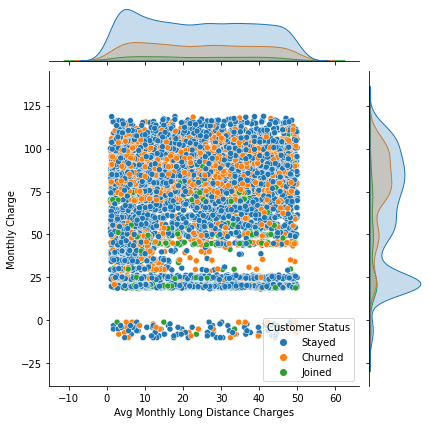

<Figure size 1080x504 with 0 Axes>

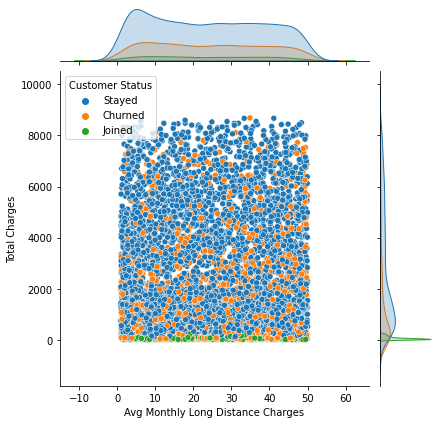

<Figure size 1080x504 with 0 Axes>

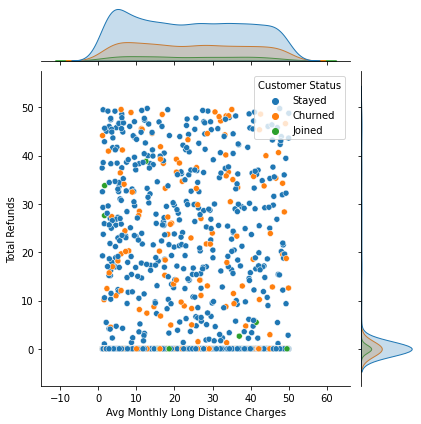

<Figure size 1080x504 with 0 Axes>

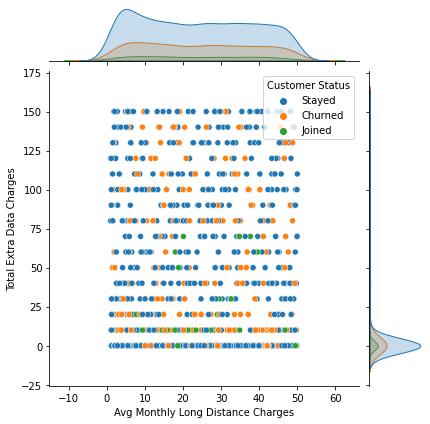

<Figure size 1080x504 with 0 Axes>

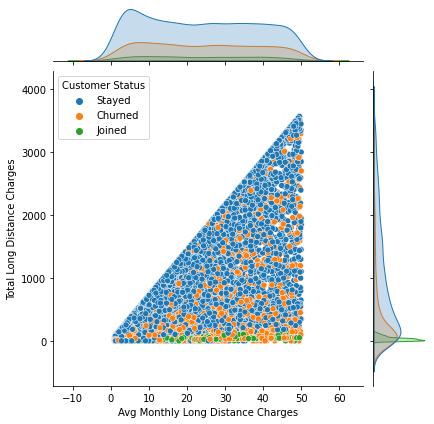

<Figure size 1080x504 with 0 Axes>

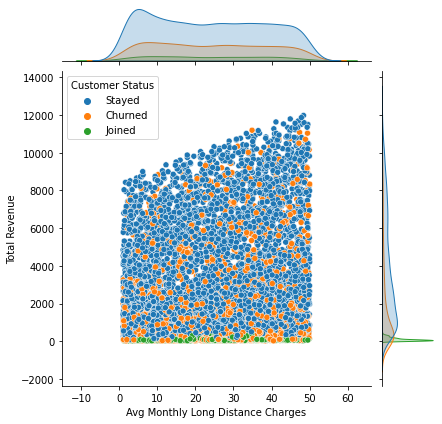

<Figure size 1080x504 with 0 Axes>

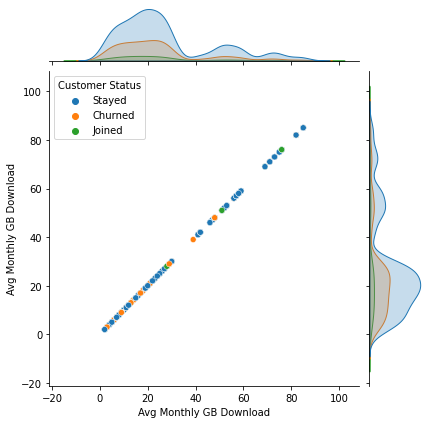

<Figure size 1080x504 with 0 Axes>

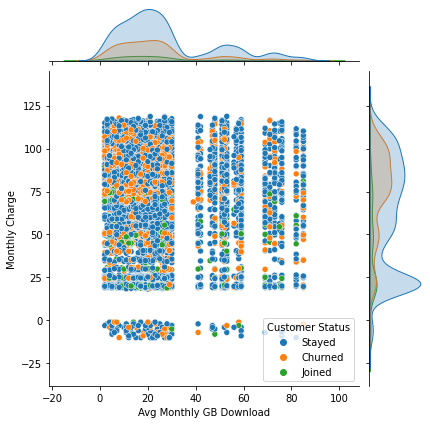

<Figure size 1080x504 with 0 Axes>

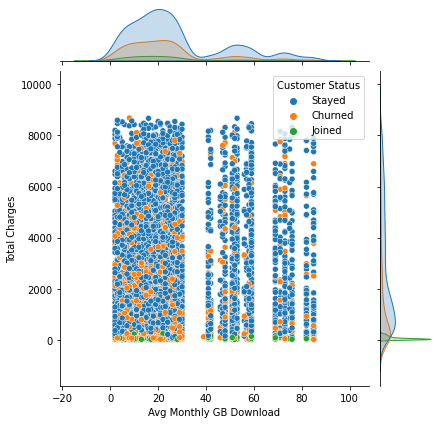

<Figure size 1080x504 with 0 Axes>

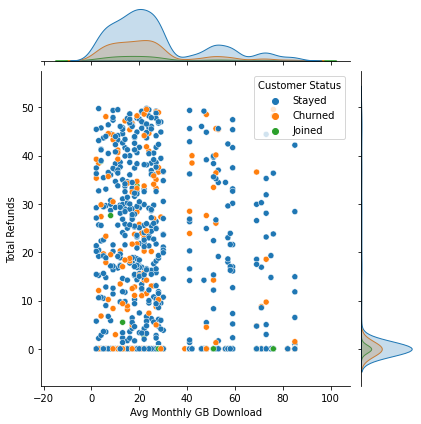

<Figure size 1080x504 with 0 Axes>

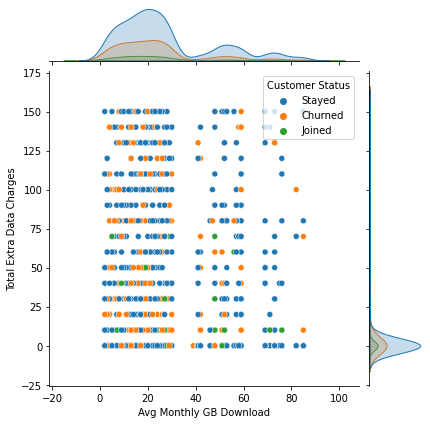

<Figure size 1080x504 with 0 Axes>

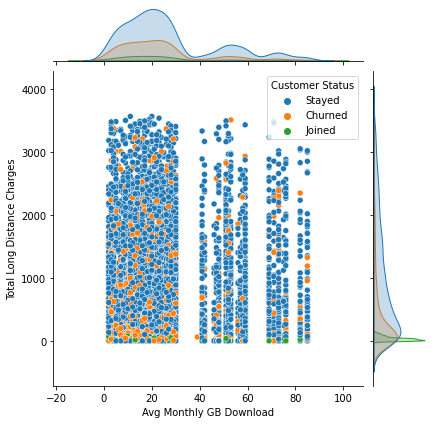

<Figure size 1080x504 with 0 Axes>

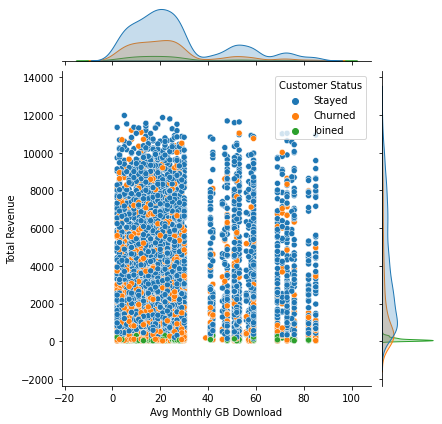

<Figure size 1080x504 with 0 Axes>

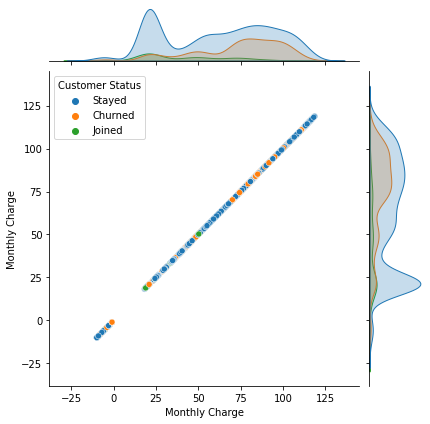

<Figure size 1080x504 with 0 Axes>

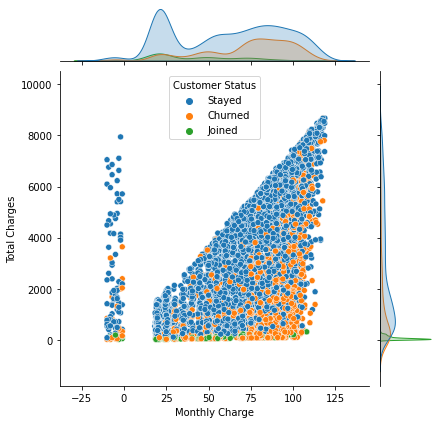

<Figure size 1080x504 with 0 Axes>

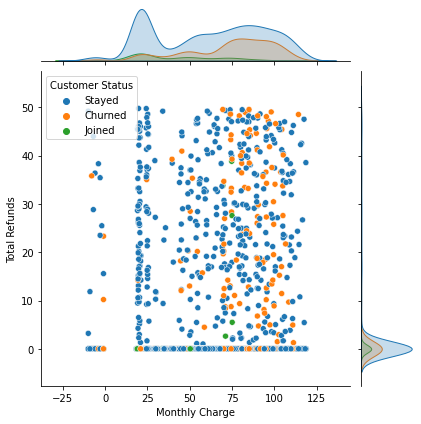

<Figure size 1080x504 with 0 Axes>

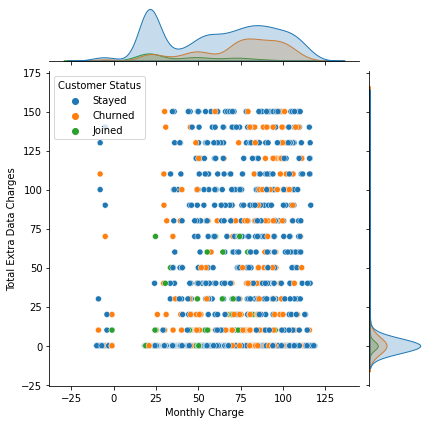

<Figure size 1080x504 with 0 Axes>

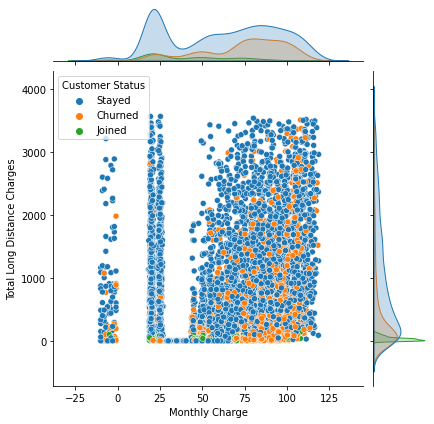

<Figure size 1080x504 with 0 Axes>

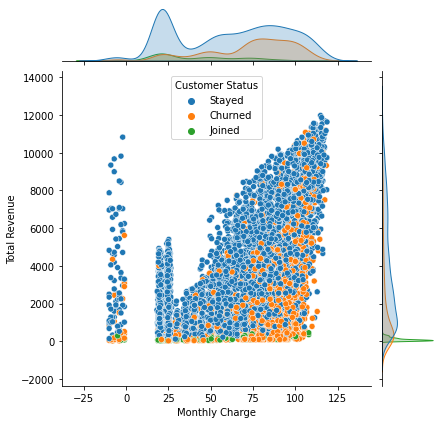

<Figure size 1080x504 with 0 Axes>

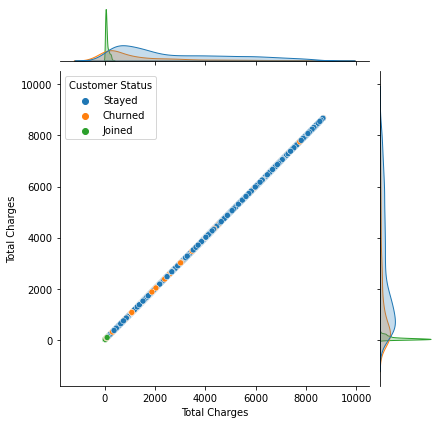

<Figure size 1080x504 with 0 Axes>

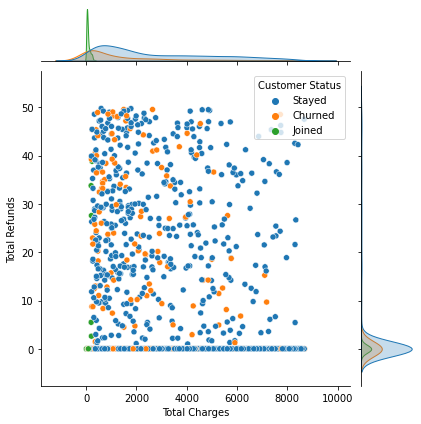

<Figure size 1080x504 with 0 Axes>

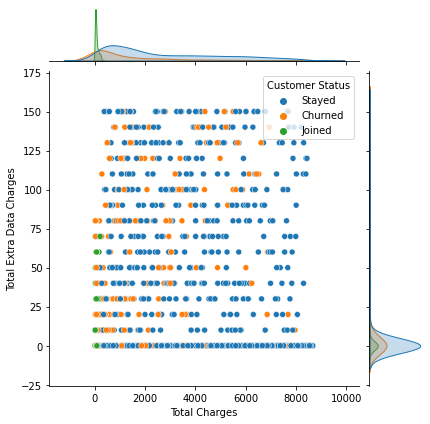

<Figure size 1080x504 with 0 Axes>

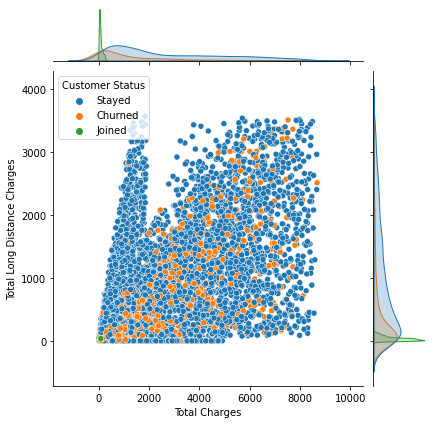

<Figure size 1080x504 with 0 Axes>

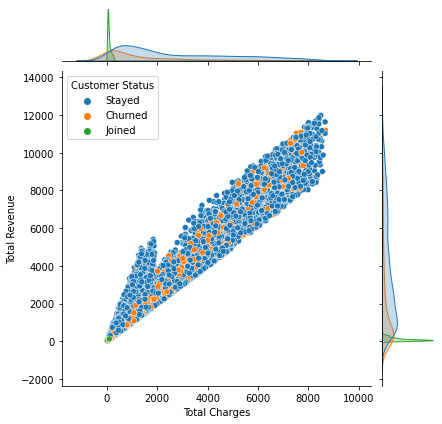

<Figure size 1080x504 with 0 Axes>

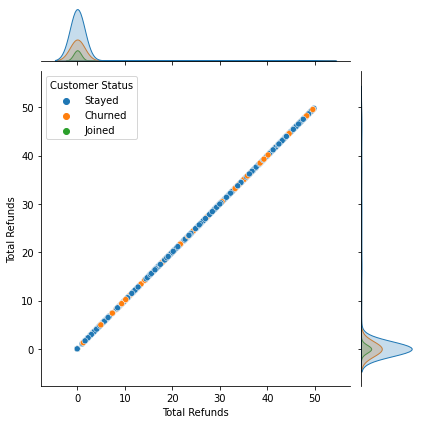

<Figure size 1080x504 with 0 Axes>

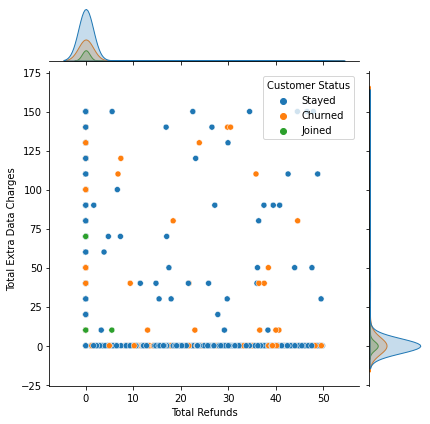

<Figure size 1080x504 with 0 Axes>

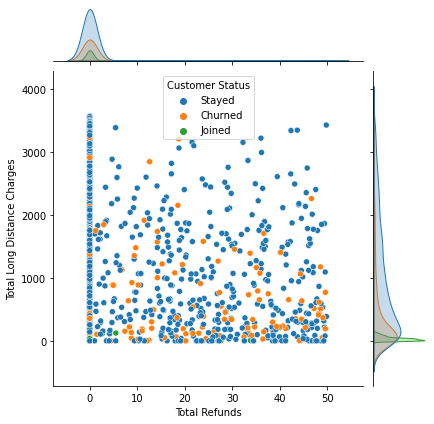

<Figure size 1080x504 with 0 Axes>

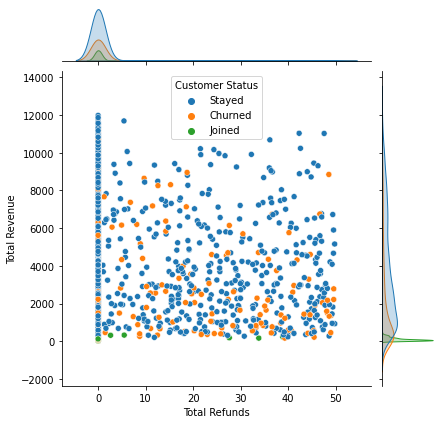

<Figure size 1080x504 with 0 Axes>

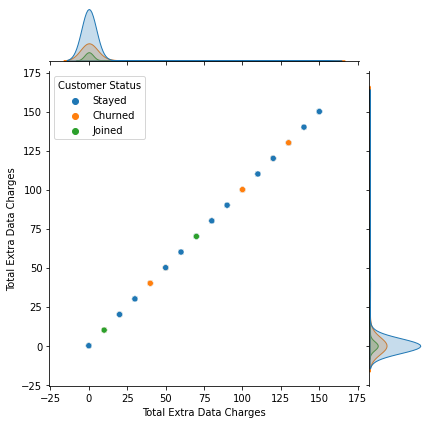

<Figure size 1080x504 with 0 Axes>

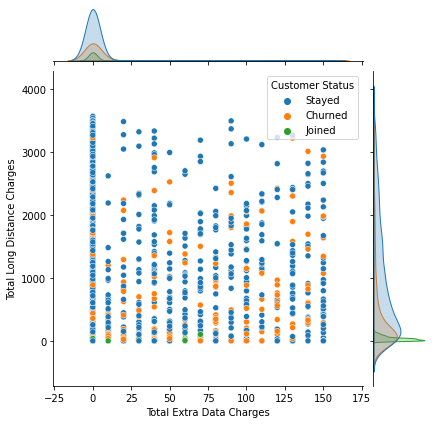

<Figure size 1080x504 with 0 Axes>

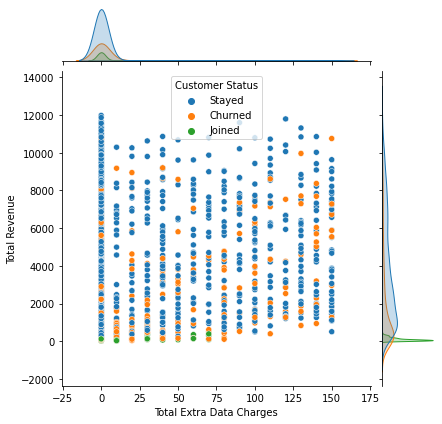

<Figure size 1080x504 with 0 Axes>

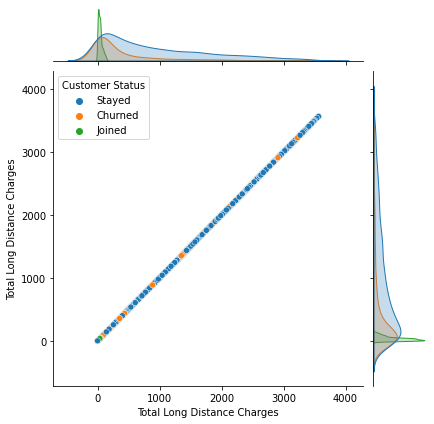

<Figure size 1080x504 with 0 Axes>

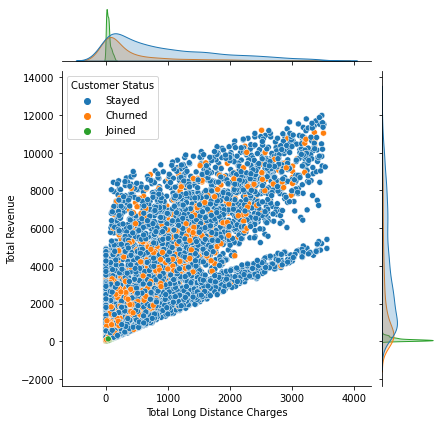

<Figure size 1080x504 with 0 Axes>

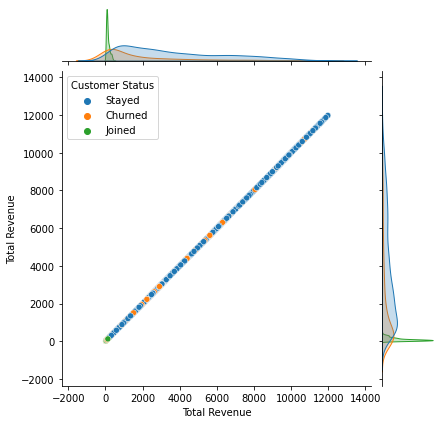

In [40]:
for col1 in range(len(numeric_columns)):
  for col2 in range(col1,len(numeric_columns)):
    plt.figure(figsize=(15,7))
    sns.jointplot(data=df, x=numeric_columns[col1], y=numeric_columns[col2], hue="Customer Status")
    plt.show()

Box Plots

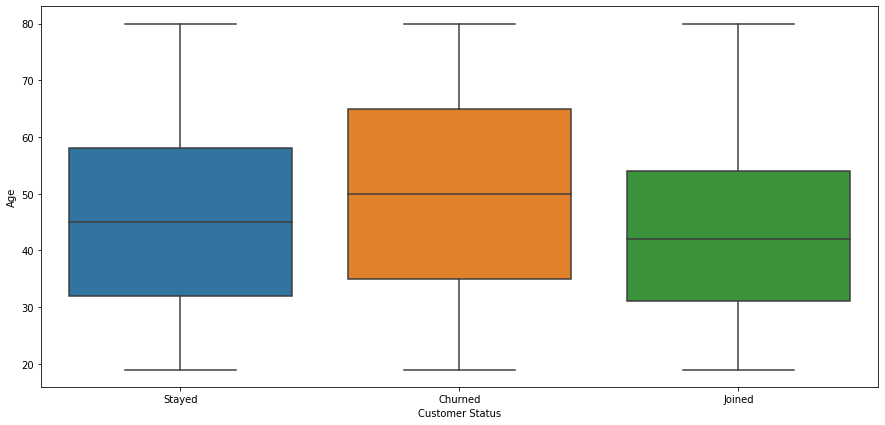

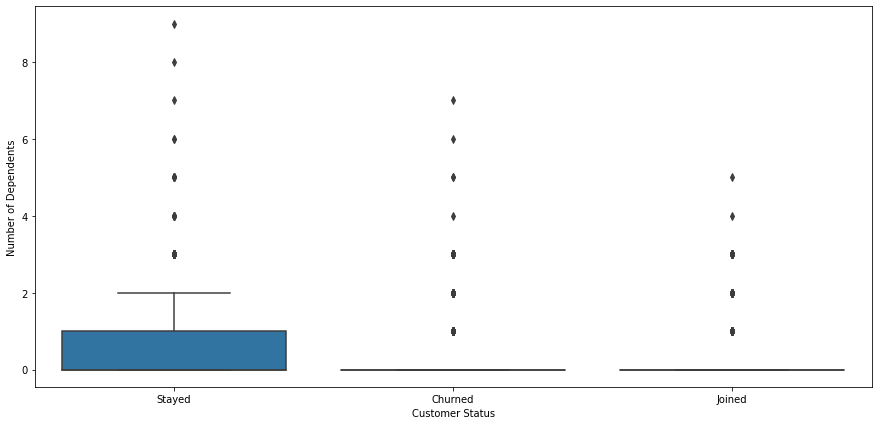

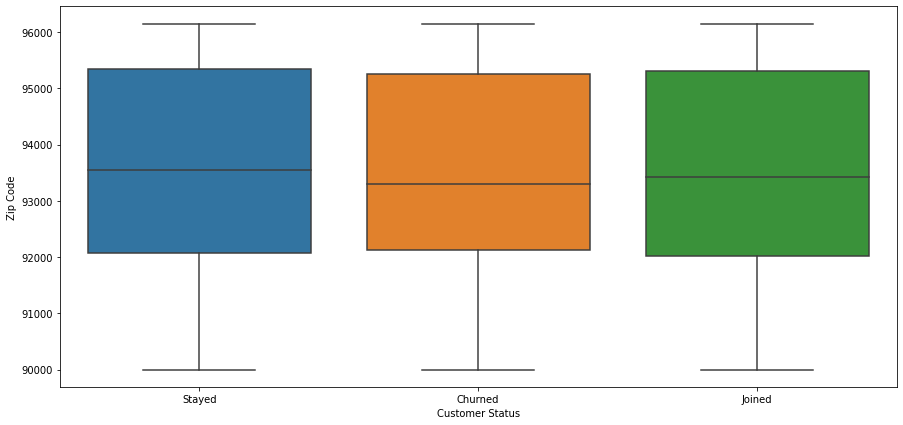

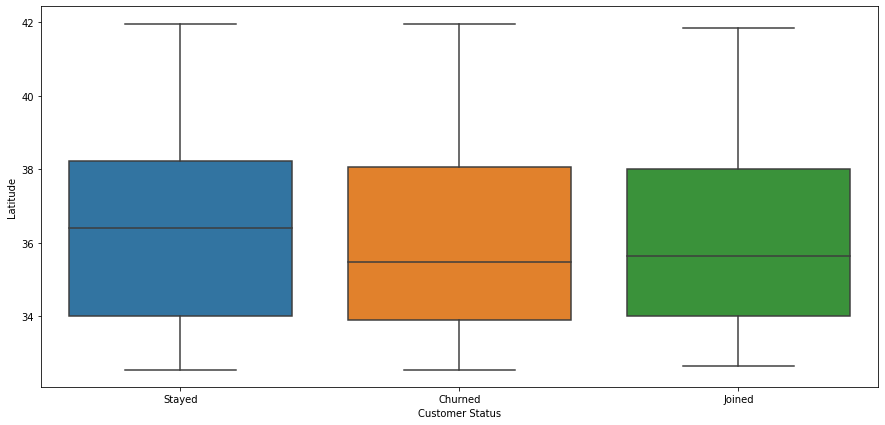

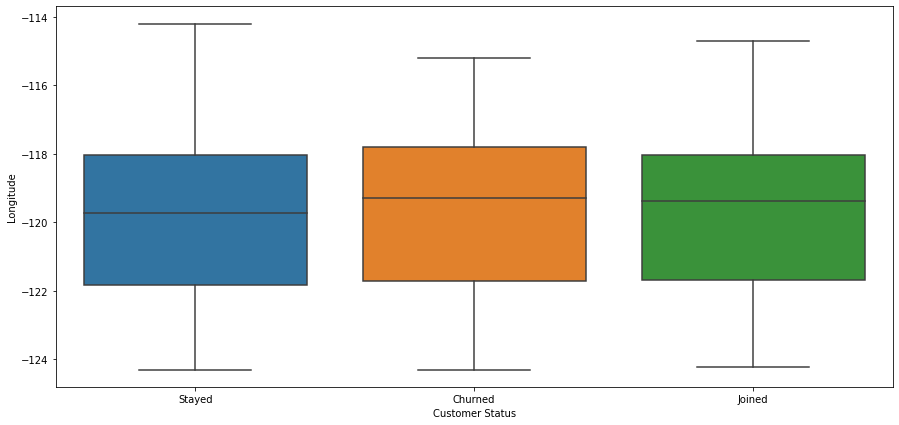

...

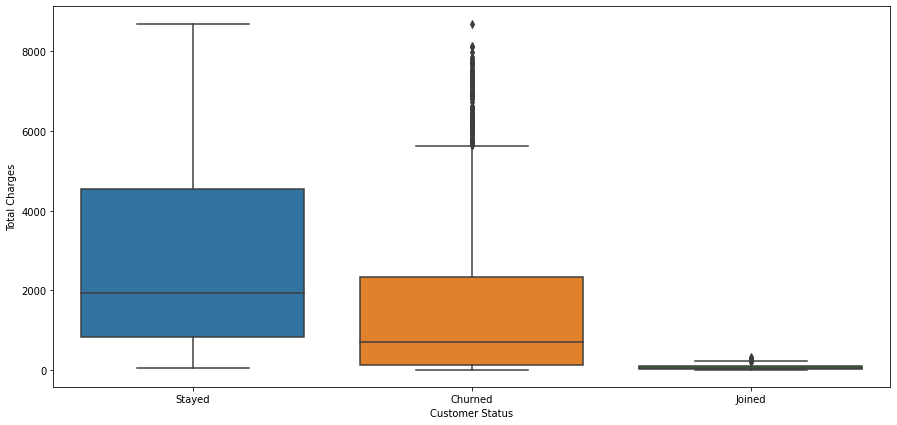

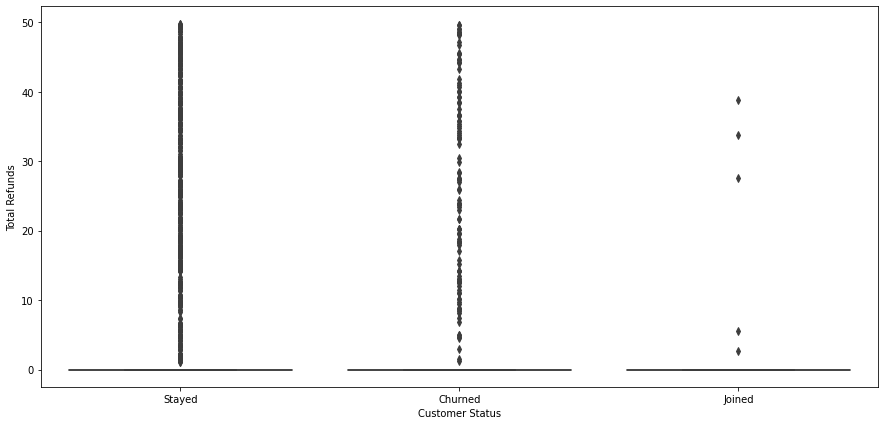

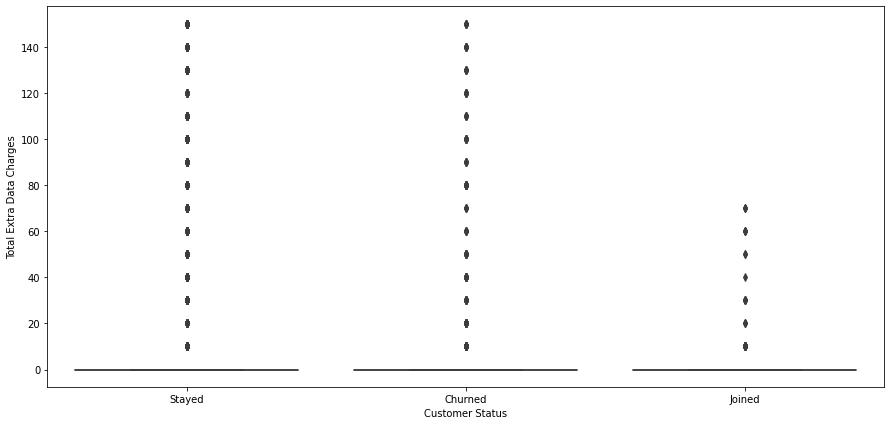

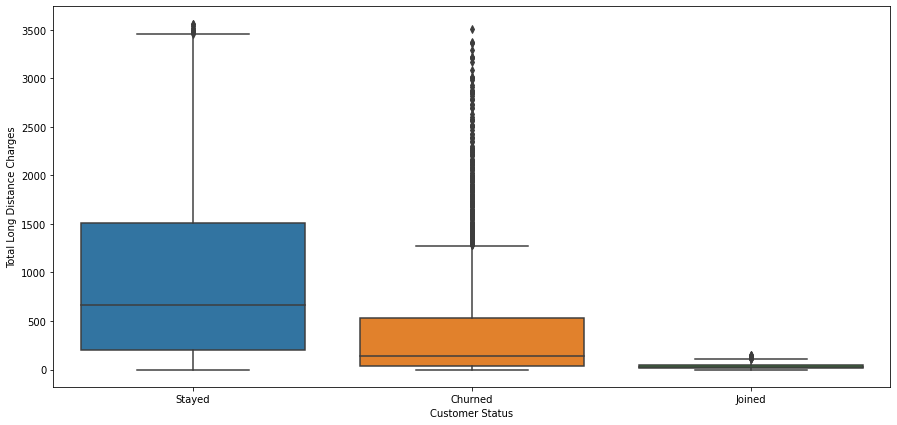

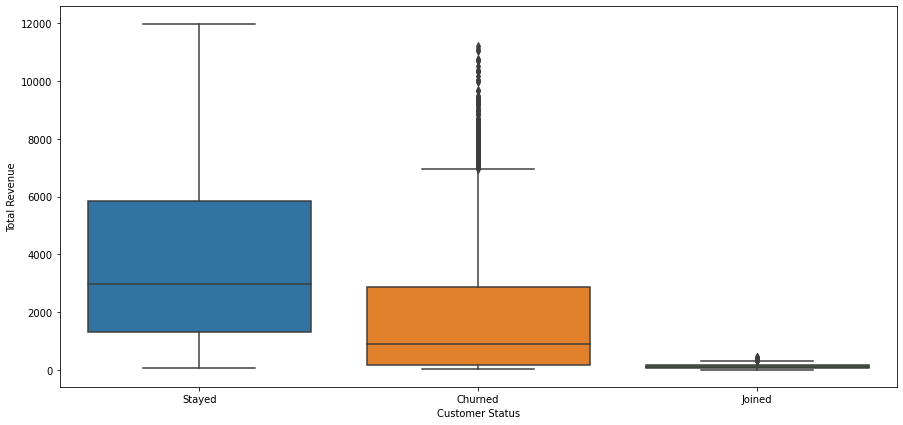

In [41]:
for col in numeric_columns:
  plt.figure(figsize=(15,7))
  sns.boxplot(y=col,x='Customer Status',data=data)
  plt.show()

High Value Customers

In [42]:
df['Total Revenue'].mean()

3034.3790558000856

In [43]:
rev_generating = df.loc[(df['Total Revenue'] >= df['Total Revenue'].mean())]
len(rev_generating)

test_df = df.copy()
test_df['High Value'] = df['Total Revenue'] >= df['Total Revenue'].mean()
test_df.head()
# df.loc[(df['Internet Service'] == 'Yes') & (df['Customer Status'] == 'Churned')]

,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,...,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason,Customer Status,High Value
0,Female,37.0,Yes,0.0,Frazier Park,93225.0,34.827662,-118.999073,2.0,9.0,...,65.6,593.30,0.00,0.0,381.51,974.81,Not Valid,Not Valid,Stayed,False
1,Male,46.0,No,0.0,Glendale,91206.0,34.162515,-118.203869,0.0,9.0,...,-4.0,542.40,38.33,10.0,96.21,610.28,Not Valid,Not Valid,Stayed,False
2,Male,50.0,No,0.0,Costa Mesa,92627.0,33.645672,-117.922613,0.0,4.0,...,73.9,280.85,0.00,0.0,134.60,415.45,Competitor,Competitor had better devices,Churned,False
3,Male,78.0,Yes,0.0,Martinez,94553.0,38.014457,-122.115432,1.0,13.0,...,98.0,1237.85,0.00,0.0,361.66,1599.51,Dissatisfaction,Product dissatisfaction,Churned,False
4,Female,75.0,Yes,0.0,Camarillo,93010.0,34.227846,-119.079903,3.0,3.0,...,83.9,267.40,0.00,0.0,22.14,289.54,Dissatisfaction,Network reliability,Churned,False


Text(0.5, 1.0, 'Total Revenue vs Total Charges')

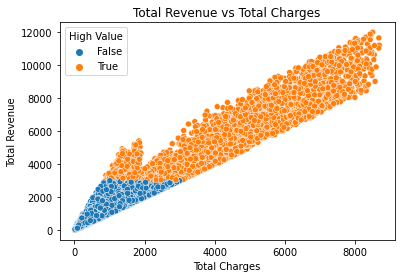

In [44]:
# # Index(['Gender', 'Age', 'Married', 'Number of Dependents', 'City', 'Zip Code',
# #        'Latitude', 'Longitude', 'Number of Referrals', 'Tenure in Months',
# #        'Offer', 'Phone Service', 'Avg Monthly Long Distance Charges',
# #        'Multiple Lines', 'Internet Service', 'Internet Type',
# #        'Avg Monthly GB Download', 'Online Security', 'Online Backup',
# #        'Device Protection Plan', 'Premium Tech Support', 'Streaming TV',
# #        'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract',
# #        'Paperless Billing', 'Payment Method', 'Monthly Charge',
# #        'Total Charges', 'Total Refunds', 'Total Extra Data Charges',
# #        'Total Long Distance Charges', 'Total Revenue', 'Churn Category',
# #        'Churn Reason', 'Customer Status'],
# #       dtype='object')

sns.scatterplot(data = test_df,x = 'Total Charges',y='Total Revenue',hue = 'High Value')
plt.title('Total Revenue vs Total Charges')
# High value customers are more likely to pay more

In [45]:
services = ['Internet Service','Internet Type','Online Security', 'Online Backup',
       'Device Protection Plan', 'Premium Tech Support', 'Streaming TV',
       'Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract',
       'Paperless Billing', 'Payment Method']



[Text(0, 0.5, ''), Text(0.5, 0, '')]

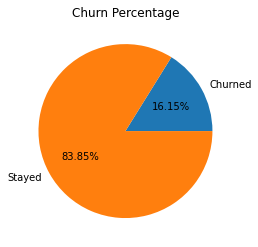

In [46]:
ax = rev_generating.groupby(['Customer Status']).size().plot(kind = 'pie', autopct = '%.2f%%')
plt.title('Churn Percentage')
ax.set(xlabel = None, ylabel = None)

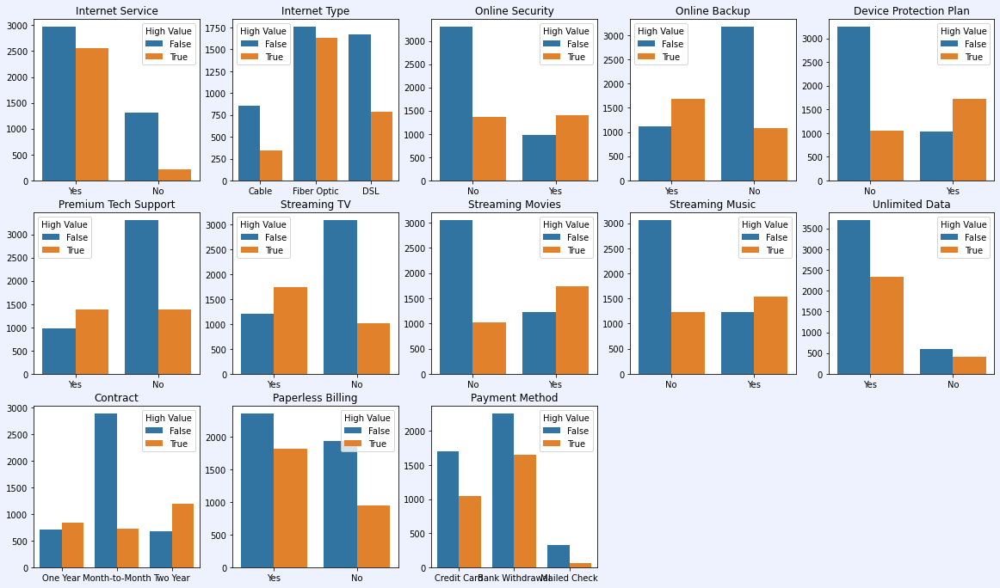

In [47]:
idx = 1
fig = plt.figure(figsize = (20, 20), facecolor = '#EEF2FF')
for i in services:
    # print(idx)
    plt.subplot(5, 5, idx)
    # ax = rev_generating.groupby([categorical_columns[i]]).size()..plot(kind = 'pie', autopct = '%.2f%%', colors = ['#FF5959', '#676FA3','#FFA372', '#4E89AE', '#43658B'])
    ax = sns.countplot(data=test_df,x=i,hue='High Value')
    ax.set(xlabel = None, ylabel = None)
    plt.title(str(i),loc = 'center')
    plt.xticks(rotation = 0, fontsize = 10)
    idx+=1

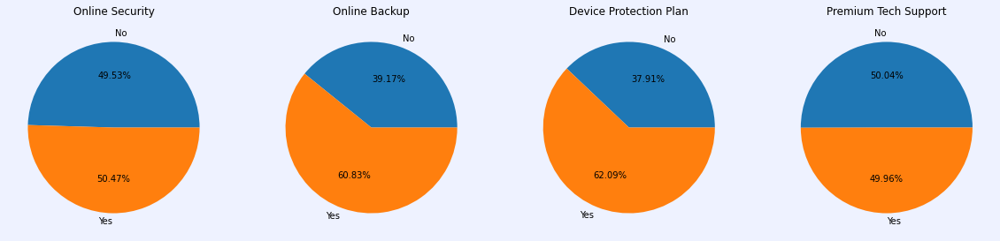

In [48]:
pie_columns = ['Online Security', 'Online Backup','Device Protection Plan', 'Premium Tech Support']
idx = 1
fig = plt.figure(figsize = (20, 20), facecolor = '#EEF2FF')
for i in pie_columns:
    # print(idx)
    plt.subplot(1, 4, idx)
    # plt.figure()
    # ax = rev_generating.groupby([categorical_columns[i]]).size()..plot(kind = 'pie', autopct = '%.2f%%', colors = ['#FF5959', '#676FA3','#FFA372', '#4E89AE', '#43658B'])
    ax = rev_generating.groupby([i]).size().plot(kind = 'pie', autopct = '%.2f%%')
    ax.set(xlabel = None, ylabel = None)
    plt.title(str(i))
    idx+=1


Text(0.5, 1.0, 'Reasons for churning among High-Value')

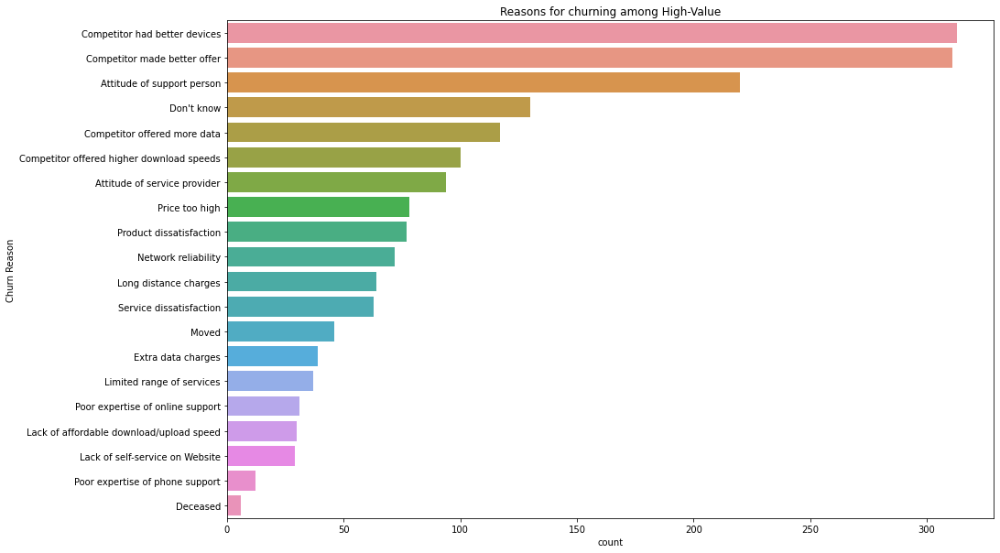

In [49]:
# Major reason of churn among hgh paying - Churn Category and Churn Reason
fig = plt.figure(figsize = (15, 10))
sns.countplot(data = rev_generating, y = data['Churn Reason'], order = data['Churn Reason'].value_counts().index)
ax.set(xlabel = None, ylabel = None)
plt.title('Reasons for churning among High-Value')

Text(0.5, 1.0, 'Churn Categories aming High-Paying Customers')

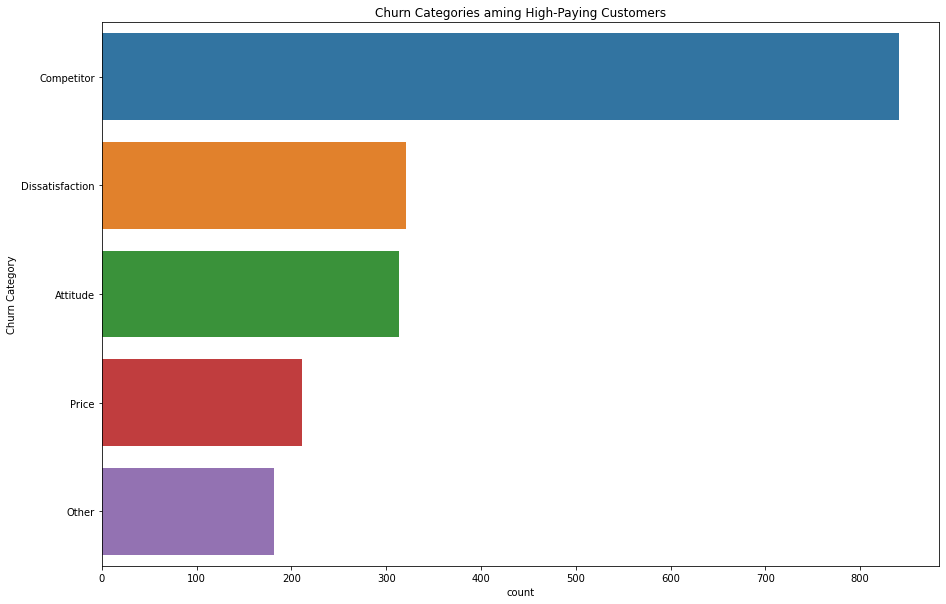

In [50]:
# Major reason of churn among hgh paying - Churn Category and Churn Reason
fig = plt.figure(figsize = (15, 10))
sns.countplot(data = rev_generating, y = data['Churn Category'], order = data['Churn Category'].value_counts().index)
ax.set(xlabel = None, ylabel = None)
plt.title("Churn Categories aming High-Paying Customers")

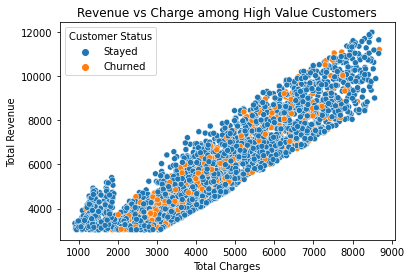

In [51]:

# Charges vs Revenue
plt.title("Revenue vs Charge among High Value Customers")
sns.scatterplot(data=rev_generating,x='Total Charges',y='Total Revenue',hue='Customer Status')

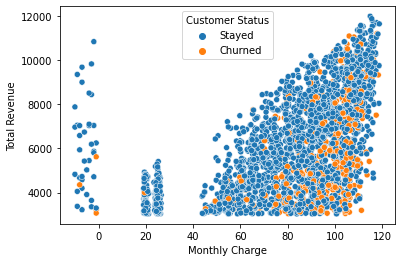

In [52]:
sns.scatterplot(data=rev_generating,x='Monthly Charge',y='Total Revenue',hue='Customer Status')

Text(0.5, 1.0, 'High Value Customer')

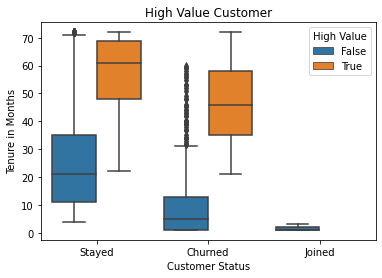

In [53]:
sns.boxplot(y='Tenure in Months',x='Customer Status',data=test_df,hue='High Value')
plt.title("High Value Customer")

Text(0.5, 1.0, 'High Value Customer')

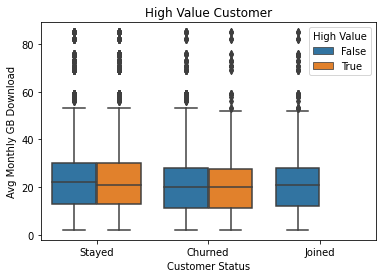

In [54]:
sns.boxplot(y='Avg Monthly GB Download',x='Customer Status',data=test_df,hue='High Value')
plt.title("High Value Customer")

In [55]:
churn_df = df.loc[df['Customer Status'] == 'Churned']
len(churn_df)


1869

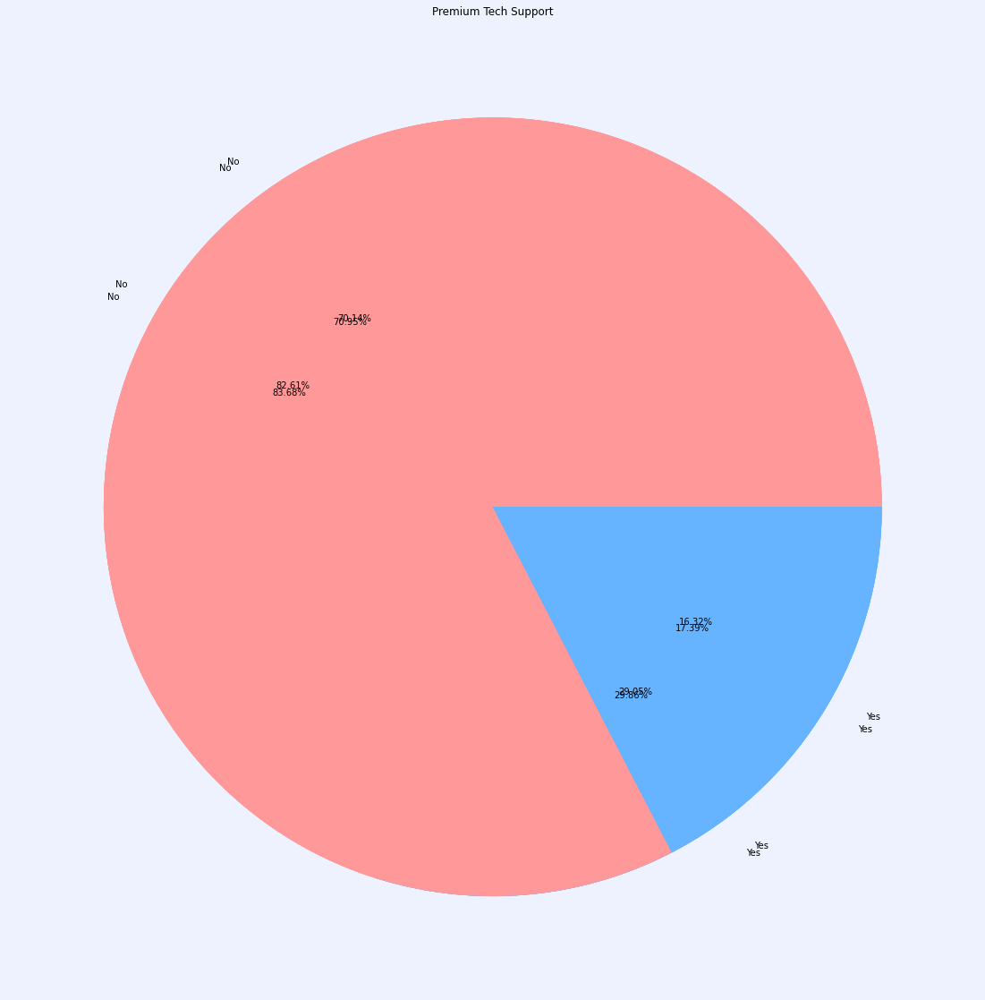

In [56]:

# pie_columns = ['Married',  'Offer', 'Phone Service', 'Multiple Lines', 'Internet Service', 'Internet Type','Online Security', 'Online Backup','Device Protection Plan', 'Premium Tech Support', 'Streaming TV','Streaming Movies', 'Streaming Music', 'Unlimited Data', 'Contract', 'Paperless Billing', 'Payment Method', 'Customer Status']
pie_columns = ['Online Security', 'Online Backup','Device Protection Plan', 'Premium Tech Support']
idx = 1
fig = plt.figure(figsize = (20, 20), facecolor = '#EEF2FF')
colors = ['#ff9999','#66b3ff','#99ff99','#ffcc99']
for i in pie_columns:
    # print(idx)
    # plt.figure()
    # ax = rev_generating.groupby([categorical_columns[i]]).size()..plot(kind = 'pie', autopct = '%.2f%%', colors = ['#FF5959', '#676FA3','#FFA372', '#4E89AE', '#43658B'])
    ax = churn_df.groupby([i]).size().plot(kind = 'pie', autopct = '%.2f%%',colors =colors)
    ax.set(xlabel = None, ylabel = None)
    plt.title(str(i))
    idx+=1


In [57]:
# X and y split
df1=final_df.copy()
X = df1.drop('Customer Status',axis = 1)
X.head(2)


,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,...,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason
0,0.0,37.0,0.0,0.0,0.0,93225.0,34.827662,-118.999073,2.0,9.0,...,0.0,0.0,65.6,593.3,0.00,0.0,381.51,974.81,0.0,0.0
1,1.0,46.0,1.0,0.0,1.0,91206.0,34.162515,-118.203869,0.0,9.0,...,1.0,0.0,-4.0,542.4,38.33,10.0,96.21,610.28,0.0,0.0


In [58]:
y = df1['Customer Status']
y.value_counts()


# replacing Joined(2) by Stayed(1)
y.replace(2,0,inplace=True)

In [59]:
y.value_counts()

0.0    5174
1.0    1869
Name: Customer Status, dtype: int64

In [60]:
y_tsne = data['Customer Status']
# y_tsne.value_counts()
y_tsne.head()

0     Stayed
1     Stayed
2    Churned
3    Churned
4    Churned
Name: Customer Status, dtype: object

In [61]:
X.head(2)

,Gender,Age,Married,Number of Dependents,City,Zip Code,Latitude,Longitude,Number of Referrals,Tenure in Months,...,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Churn Category,Churn Reason
0,0.0,37.0,0.0,0.0,0.0,93225.0,34.827662,-118.999073,2.0,9.0,...,0.0,0.0,65.6,593.3,0.00,0.0,381.51,974.81,0.0,0.0
1,1.0,46.0,1.0,0.0,1.0,91206.0,34.162515,-118.203869,0.0,9.0,...,1.0,0.0,-4.0,542.4,38.33,10.0,96.21,610.28,0.0,0.0


In [62]:
y.head()

0    0.0
1    0.0
2    1.0
3    1.0
4    1.0
Name: Customer Status, dtype: float64

In [63]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42,shuffle=True,stratify=y)

In [64]:
print(X_train.shape)
print(y_train.shape)
print(X_test.shape)
print(y_test.shape)


(5282, 36)
(5282,)
(1761, 36)
(1761,)


Feature Selection


In [65]:
# Removing features which have higher correlation only of the training dataset
correlated_features = set()
correlation_matrix = X_train.corr()

for i in range(len(correlation_matrix .columns)):
    for j in range(i):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            colname = correlation_matrix.columns[i]
            correlated_features.add(colname)

print(correlated_features,len(correlated_features))
train_X=X_train.copy()

X_train.drop(labels=correlated_features, axis=1, inplace=True)
X_test.drop(labels=correlated_features, axis=1, inplace=True)

{'Total Revenue', 'Latitude', 'Total Charges', 'Streaming Music', 'Longitude'} 5


In [66]:
from sklearn.feature_selection import VarianceThreshold
# # checking the features which have zero variance and removing them
v_threshold=VarianceThreshold(threshold=0)
v_threshold.fit(X_train)   
v_threshold.get_support()

array([ True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True,  True,  True,  True,  True,  True,
        True,  True,  True,  True])

Random Forest Implementation Feature Selection

In [67]:
# Random forest implementation
import pandas as pd
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split

In [68]:
# sel = SelectFromModel(RandomForestClassifier(n_estimators = 100))
# sel.fit(X_train, y_train)

In [69]:
# sel.get_support()

Choosing model

In [70]:
# importing for the algo below
from sklearn.naive_bayes import GaussianNB
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import f1_score
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

T-SNE reduction to 2 dimensions

In [81]:
from sklearn.manifold import TSNE
mean_temp = X.mean()
std_temp = X.std()
X_norm = (X - mean_temp)/std_temp

# reducing to 2 components
dimension = 2
tsne = TSNE(dimension)
tsne = tsne.fit_transform(X_norm)
tsne # features are reduced to 2 dimensions


/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:780: FutureWarning:

The default initialization in TSNE will change from 'random' to 'pca' in 1.2.

/usr/local/lib/python3.8/dist-packages/sklearn/manifold/_t_sne.py:790: FutureWarning:

The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.



array([[ 3.5701748e-02,  2.0342393e+00],
       [ 2.8855793e+00,  4.7276779e+01],
       [-1.3132192e+01, -9.9515371e+00],
       ...,
       [-2.1213364e+01,  1.4912268e+01],
       [ 6.9093742e+01, -2.2682167e+01],
       [-1.8332588e+01, -7.4490784e+01]], dtype=float32)

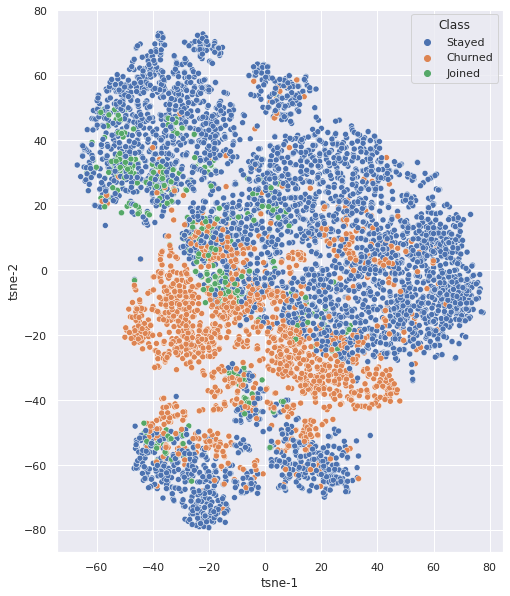

In [82]:
df_tsne = pd.DataFrame(
    {'tsne-1': tsne[:,0], 
     'tsne-2': tsne[:,1],
     'Class': y_tsne}
)
sns.set(rc={"figure.figsize":(8,10)}) 
sns.scatterplot(x='tsne-1', y='tsne-2', hue='Class', data=df_tsne)
# sns.scatterplot(x='tsne_1', y='tsne_2', hue='label', data=df_tsne, ax=ax,s=120)
lim = (tsne.min()-5, tsne.max()+5)
# Somewhat separable but not completely